# BLUF



We found the hotel booking data and would like to **make a prediction about the cancellation**. We completed the libraries imorted and data imported part. Our dataset has more than 11,000 data, but we do not have enough computing power, so we sample our dataset down to 3,0000. 

**Then we did the EDA**. We checked the data shape, types, and info. Then we dropped the useless columns and converted the data type to get year, month, and day column.After that, we counted the NAs, duplicates, and unique values for each column. 
Last, We did the data visualization for three common questions for tha dataset,as well as ran through the Auto Visualization. 

*   Which countries are the custoemrs from?
*   How much did customers pay per night? 
*   Which is the busiest month for the hote?

For **data preporcessing** part, first, we noticed that there are 5649 duplicates. After checking the original dataset, we confirmed that those are actually duplicates, so we dropped duplicates, and dropped missing values as well. Next, we used LabelEncoder to label encode categorical variables.Next, we splited our predictors and target variables and did skewness correction. After that, we used corrected data to windsorize X and elimiates the outliers(determined by Tukey's method). Then, we used this data to split into test and training dataset using 25% and 75%. Last step was to standardize the training data. We finished our data preprocessing part.

Furthermore, we would like see the **Strength of predictors.**We fitted our preproessed data to PCA model.However, we saw that explained variance per compent was pretty low(highest only around 0.14), which meant these PCAs were not useful for us. Then we used randomforest classifier to get the feature importance. We could see that around 3/4 of features that were useful to build the model. And from RFE, we found lead_time', 'arrival_date_week_number', 'adr' 'total_of_special_requests', 'month'these features are important.

**First time running(using all the features not showing in this notebook)-**
we decided to use all the feature to run the classifier horse race one time to see what's going on. After running the model, We selected the best performance classifier LGBM to do gird search, draw learning curve, propensity,and run XAI. From XAI, we picked the top 10 most important features and tried to use these features to rerun the model.

**Second time runing(select 10 features)**
From XAI, we selected 'lead_time','total_of_special_requests','month','adr','country','arrival_date_week_number','day','market_segment','stays_in_week_nights','arrival_date_day_of_month'. After running classifier horse race, LightGMB still have the highest Avg AUC and Avg accuracy(results check leadborad below)

|**Classifiers** |   Average AUC |Average accuracy|
|:----------------------|:------------|:---------:|
|LightGBM | 0.979 |0.987|
|MLP |0.971 |0.982 |
|SVM|0.837| 0.875|
|XG Boost| 0.812| 0.851|
|k Nearest Neighbors |0.785|0.820|
|Logistic Regression |0.732|0.740|
|Random Forest | 0.696|0.720|
|Decision Tree |0.694 |0.700 |
|Perceptron  |0.660| 0.648|
| Naive Bayes |0.598|0.447|
|PyCaret(xgboost)|0.9988|0.9879|

Then, we did** grid search** for LGBM, and used the hyperparameter got from the grid search to run **learning curve** and **propensity.** We found that the learning curve looks really good without the overfitting. LGBM can also predict well on unseen data. After using hyperparameter got from the grid search, the AUC and Accuracy increased as well.**AUC: 0.9960101638689638 Accuracy: 0.997524241799051.**
Then we checked the **confusion matrix**. We saw that LGBM model can predict both Positive and Negative cases well. And the **propensity curve** looked decent. Table under it showed many instances propensity = 1,which indicates a high probability or a strong likelihood of a particular event or outcome occurring.

Last, since LGBM is hard to interpret, we ran **XAI** in order to increase the interprebility of LGBM. First, we ran **permuatation importance**. and **feature importance**,**Shapey Values** using LGBM classifier. We found **month, day,arrival_date_week_number,arrival_date_day_of_month** are top 4 most important features. Then we ran **PDP**, we saw basically all the 10 features have average lines in a partial dependence plot (PDP) basically all of those features have a strong positive effect on the model's prediction. It is worth to mentioning **stay_in_weeks_nights** pop plot the average line go up significantly at around -4. Last, we ran **Surrogate Models**, it showed that **arrival_date_day_of_month** is the most important features which basically matches the results as above. 



# Business Problem


For this hotel booking dataset , we would like to make a prediction about the cancellation.
What features is causing the cancellation when customers booking the hotel?

##Metrics##
AUC is chosen as the primary aggregate metric since the ROC curve is a graphical representation of the trade-off between the true positive rate (sensitivity) and the false positive rate (1-specificity) for different classification thresholds. The AUC summarizes the overall performance of the classifier by calculating the area under this curve. And we do believe that the hotel will care more about the true positve rate and false postive rate. Accuracy will also be considered. Accuracy assesses the overall percentage of error. We want to minimize false positve rate as these instances may lead hotel to lose more on relocate the customers and make the compensation to those who booked the hotels but no where to stay.


# Libraries

In [1]:
pip install catboost

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.6/98.6 MB 6.9 MB/s eta 0:00:00


In [2]:
!pip install sort-dataframeby-monthorweek

!pip install sorted-months-weekdays

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for sort-dataframeby-monthorweek: filename=sort_dataframeby_monthorweek-0.4-py3-none-any.whl size=3420 sha256=b508268582cc09e15600a24fbcf5e38fda14e1f7a883147bfc309a854f0ec107
  Stored in directory: /root/.cache/pip/wheels/6b/fd/39/06eaac8d65d641f9f50856a48b57a5ec8351be2874beff01ec
Successfully built sort-dataframeby-monthorweek
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for sorted-months-weekdays: filename=sorted_months_weekdays-0.2-py3-none-any.whl size=3223 sha256=3262801b05d526e35c36377c9df402d988394dadf6de674871bee282ddab4f2d
  Stored in directory: /root/.cache/pip/wheels/bd/b4/f6/2c29a96668a9a13a568134857fd7b7a5186261f00f1d35661c
Successfully built sorted-months-weekdays


In [3]:
!pip install -q pycaret autoviz --upgrade psynlig
from pycaret.classification import *

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 483.5/483.5 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 kB 14.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 kB 5.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 36.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━

In [4]:
from pycaret.classification import setup
from pycaret.classification import tune_model
from pycaret.classification import setup
from pycaret.classification import compare_models
from pycaret.classification import *

In [5]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported v0.1.604. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [6]:
# importing libraries
import sort_dataframeby_monthorweek as sd
%matplotlib inline
import pandas as pd
from psynlig import pca_explained_variance_bar
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats.mstats import winsorize
from sklearn.preprocessing import OneHotEncoder
import scipy.stats as ss
import math
from matplotlib.colors import ListedColormap
import missingno as msno

import warnings
warnings.filterwarnings('ignore')
#sklearn
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from xgboost import XGBClassifier
from sklearn.metrics import roc_auc_score, log_loss, balanced_accuracy_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.inspection import partial_dependence
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import permutation_importance
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import VotingClassifier

import folium
from folium.plugins import HeatMap
import plotly.express as px

plt.style.use('fivethirtyeight')
%matplotlib inline
pd.set_option('display.max_columns', 32)

import sklearn                                          # Sci-Kit Learn library (most important machine learning library in Python) 
from sklearn import datasets                            # Imports some toy daatsets embedded in the sklean library
from sklearn.preprocessing import StandardScaler        # Used to standardize a column of data (i.e., create z scores) 
from sklearn.linear_model import Perceptron             # Implementation of the Perceptron algorithm in sklearn 
from sklearn.metrics import accuracy_score              # Used to compute the accuracy of a machine learning classifier
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

# mblearn library
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as imbpipeline
from sklearn.pipeline import Pipeline
from sklearn.datasets import make_classification




# Data Dictionary

The predictors/deatires are as follows:



*   List item
*   is_canceled:Value indicating if the booking was canceled (1) or not (0)
*   lead_time :Number of days that elapsed between the entering date of the booking into the PMS and the arrival date
*   arrival_date_year: Year of arrival date
*   arrival_date_month: Month of arrival date
*   arrival_date_week_number: Week number of year for arrival date
*   arrival_date_day_of_month: Day of arrival date
*   stays_in_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
*   stays_in_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
*   adults:Number of adults
*children : Number of children
* babies:
Number of babies
*meal:
Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner)
*country:
Country of origin. Categories are represented in the ISO 3155–3:2013 format
*market_segment:
Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”
*distribution_channel:
Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”
*is_repeated_guest:
Value indicating if the booking name was from a repeated guest (1) or not (0)
*previous_cancellations:
Number of previous bookings that were cancelled by the customer prior to the current booking
*previous_bookings_not_canceled:
Number of previous bookings not cancelled by the customer prior to the current booking
*reserved_room_type:
Code of room type reserved. Code is presented instead of designation for anonymity reasons.
*assigned_room_type:
Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.
*booking_changes:
Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation
*deposit_type:
Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay.
*agent:
ID of the travel agency that made the booking
*company:
ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons
*days_in_waiting_list:
Number of days the booking was in the waiting list before it was confirmed to the customer
*customer_type:
Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking
*adr:
Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights
*required_car_parking_spaces:
Number of car parking spaces required by the customer
*total_of_special_requests:
Number of special requests made by the customer (e.g. twin bed or high floor)
*reservation_status:
Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why
*reservation_status_date:
Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel

Acknowledge: The content above adapt from url: https://www.kaggle.com/datasets/jessemostipak/hotel-booking-demand

# Data

In [7]:
# File: https://drive.google.com/file/d/1cUH33_cxWDH6mdN5V27Q2FPOCZy1V7Om/view?usp=share_link
url = 'https://drive.google.com/uc?id=1cUH33_cxWDH6mdN5V27Q2FPOCZy1V7Om'

# Read in the dataset
df = pd.read_csv(url)

In [8]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# Exploratory Data Analysis

## check data

In [9]:
 df=df.sample(n=30000)
# Shape of df
print("Shape", df.shape)

# Check data types
print(df.info())

Shape (30000, 32)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 429 to 53690
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           30000 non-null  object 
 1   is_canceled                     30000 non-null  int64  
 2   lead_time                       30000 non-null  int64  
 3   arrival_date_year               30000 non-null  int64  
 4   arrival_date_month              30000 non-null  object 
 5   arrival_date_week_number        30000 non-null  int64  
 6   arrival_date_day_of_month       30000 non-null  int64  
 7   stays_in_weekend_nights         30000 non-null  int64  
 8   stays_in_week_nights            30000 non-null  int64  
 9   adults                          30000 non-null  int64  
 10  children                        29998 non-null  float64
 11  babies                          30000 non-null  int64  
 12  meal        

In [10]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [11]:
#convert to datetime format and add year, month, and day columns
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

df['year'] = df['reservation_status_date'].dt.year
df['month'] = df['reservation_status_date'].dt.month
df['day'] = df['reservation_status_date'].dt.day


In [12]:
# Drop useless column
df = df.drop(['agent','company','reservation_status','reservation_status_date'], axis=1)
df = df.drop(['arrival_date_year', 'arrival_date_month','assigned_room_type'],axis=1)

In [13]:
# Feature Types
categorical_features = ['meal', 'country','market_segment','distribution_channel','deposit_type', 'customer_type','reservation_status','reserved_room_type','assigned_room_type']
timing_features = ['']
target = ['is_canceled']
quant_features = list(set(df.columns) - set(target)- set(categorical_features)-set(['label']))


In [14]:
# get unique values of the target
for feature in ['is_canceled']:
  unique_values = df[feature].unique()
  print(feature,unique_values)

is_canceled [0 1]


In [15]:
# count NaNs
df.isna().sum()

hotel                               0
is_canceled                         0
lead_time                           0
arrival_date_week_number            0
arrival_date_day_of_month           0
stays_in_weekend_nights             0
stays_in_week_nights                0
adults                              0
children                            2
babies                              0
meal                                0
country                           119
market_segment                      0
distribution_channel                0
is_repeated_guest                   0
previous_cancellations              0
previous_bookings_not_canceled      0
reserved_room_type                  0
booking_changes                     0
deposit_type                        0
days_in_waiting_list                0
customer_type                       0
adr                                 0
required_car_parking_spaces         0
total_of_special_requests           0
year                                0
month       

In [16]:
# Identify duplicates (dups)
df.duplicated().sum()

5649

In [17]:
# summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,30000.0,0.366033,0.481727,0.0,0.0,0.0,1.0,1.0
lead_time,30000.0,103.191467,106.107830,0.0,18.0,69.0,159.0,629.0
arrival_date_week_number,30000.0,27.113567,13.656445,1.0,16.0,28.0,38.0,53.0
arrival_date_day_of_month,30000.0,15.821567,8.778745,1.0,8.0,16.0,24.0,31.0
stays_in_weekend_nights,30000.0,0.933333,1.001260,0.0,0.0,1.0,2.0,13.0
stays_in_week_nights,30000.0,2.503233,1.910230,0.0,1.0,2.0,3.0,32.0
adults,30000.0,1.857633,0.589104,0.0,2.0,2.0,2.0,40.0
children,29998.0,0.105407,0.401048,0.0,0.0,0.0,0.0,3.0
babies,30000.0,0.008367,0.092540,0.0,0.0,0.0,0.0,2.0
is_repeated_guest,30000.0,0.033667,0.180373,0.0,0.0,0.0,0.0,1.0


In [18]:
df.nunique()

hotel                                2
is_canceled                          2
lead_time                          463
arrival_date_week_number            53
arrival_date_day_of_month           31
stays_in_weekend_nights             13
stays_in_week_nights                27
adults                               8
children                             4
babies                               3
meal                                 5
country                            133
market_segment                       8
distribution_channel                 5
is_repeated_guest                    2
previous_cancellations              14
previous_bookings_not_canceled      41
reserved_room_type                  10
booking_changes                     15
deposit_type                         3
days_in_waiting_list               101
customer_type                        4
adr                               4276
required_car_parking_spaces          4
total_of_special_requests            6
year                     

In [19]:
# Skewness
df[quant_features].skew()

adr                                0.984259
booking_changes                    5.731088
adults                            15.940079
day                               -0.009915
children                           3.962767
stays_in_weekend_nights            1.290372
previous_cancellations            23.925344
month                              0.008073
babies                            11.296293
total_of_special_requests          1.354970
lead_time                          1.366134
arrival_date_day_of_month         -0.000808
arrival_date_week_number          -0.008881
days_in_waiting_list              11.607971
previous_bookings_not_canceled    23.412195
stays_in_week_nights               2.616604
year                              -0.164092
is_repeated_guest                  5.171120
required_car_parking_spaces        3.715383
dtype: float64

In [20]:
# create an AutoViz class
AV = AutoViz_Class()

In [21]:
# # create charts
%matplotlib inline
# dftc = AV.AutoViz(filename='', sep ='' , depVar = 'label', dfte = df, header = 0,
# verbose = 1, lowess = False, chart_format ='png', max_rows_analyzed = 2000, max_cols_analyzed = 30)

## **Countries that customers are from**

In [22]:
country_guests = df[df['is_canceled'] == 0]['country'].value_counts().reset_index()
country_guests.columns = ['country', '# guests']
country_guests

,country,# guests
0,PRT,5362
1,GBR,2465
2,FRA,2086
3,ESP,1584
4,DEU,1497
...,...,...
117,NCL,1
118,CMR,1
119,GAB,1
120,PLW,1


In [23]:
basemap = folium.Map()
guests_map = px.choropleth(country_guests, locations = country_guests['country'],
                           color = country_guests['# guests'], hover_name = country_guests['country'])
guests_map.show()

## Room prices that customers paid per night

In [24]:
data = df[df['is_canceled'] == 0]
px.box(data_frame = data, x = 'reserved_room_type', y = 'adr', color = 'hotel')

## The busiest month

In [25]:
data_resort = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
data_city = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]
resort_guests = data_resort['month'].value_counts().reset_index()
resort_guests.columns=['month','# guests']
resort_guests



,month,# guests
0,8,819
1,7,753
2,4,656
3,10,654
4,5,647
5,3,629
6,9,585
7,2,580
8,1,550
9,11,539


In [26]:
city_guests = data_city['month'].value_counts().reset_index()
city_guests.columns=['month','# guests']
print(city_guests)

    month  # guests
0       8      1325
1       7      1190
2       9      1177
3       5      1159
4      10      1102
5       6      1053
6       3      1012
7       4      1001
8       2       738
9      11       717
10      1       632
11     12       548


In [27]:
total_guests = resort_guests.merge(city_guests,on='month')
total_guests.columns=['month','# guests in resort','# guest in city hotel']



In [28]:
total_guests.sort_values('month',inplace=True)
total_guests

,month,# guests in resort,# guest in city hotel
8,1,550,632
7,2,580,738
5,3,629,1012
2,4,656,1001
4,5,647,1159
10,6,502,1053
1,7,753,1190
0,8,819,1325
6,9,585,1177
3,10,654,1102


In [29]:
px.line(total_guests, x = 'month', y = ['# guests in resort','# guest in city hotel'],
        title='Total # guests per Months', template = 'plotly_dark')

##Auto Visualization

In [30]:
 !pip install autoviz    # Installs AutoViz
# #importing Autoviz class
 from autoviz.AutoViz_Class import AutoViz_Class#Instantiate the AutoViz class
 AV = AutoViz_Class()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Shape of your Data Set loaded: (30000, 28)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
country,0.396667,0.443333,object,133,119,1,"combine rare categories, fill missing values, fix mixed data types"
children,0.006667,0.013333,float64,4,2,0,"fill missing values, right skewed distribution: cap or drop outliers"
hotel,0.000000,0.006667,object,2,0,10092,
previous_cancellations,0.000000,0.046667,int64,14,0,0,
month,0.000000,0.040000,int64,12,0,0,
year,0.000000,0.013333,int64,4,0,0,
total_of_special_requests,0.000000,0.020000,int64,6,0,0,
required_car_parking_spaces,0.000000,0.013333,int64,4,0,0,
adr,0.000000,14.253333,float64,4276,0,0,right skewed distribution: cap or drop outliers
customer_type,0.000000,0.013333,object,4,0,165,


    28 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Number of All Scatter Plots = 3


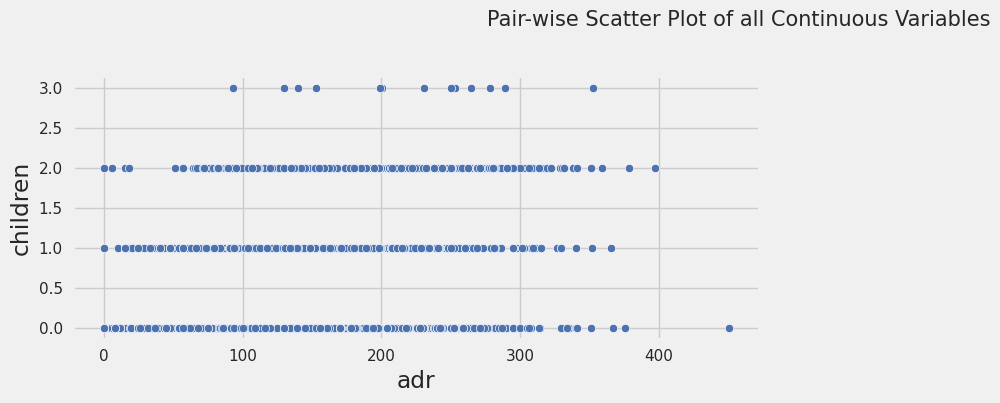

Could not draw Distribution Plot


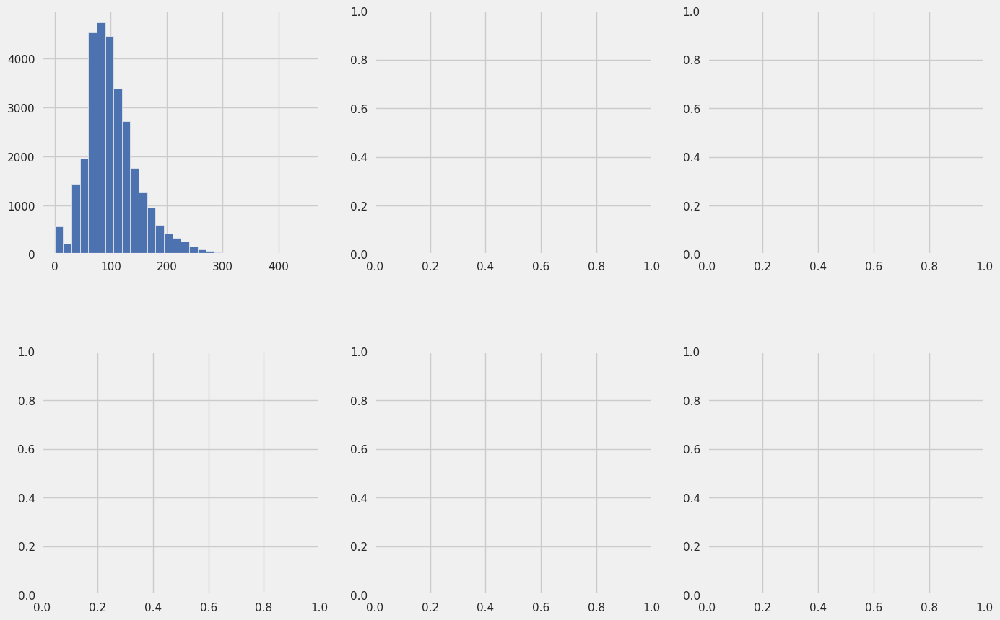

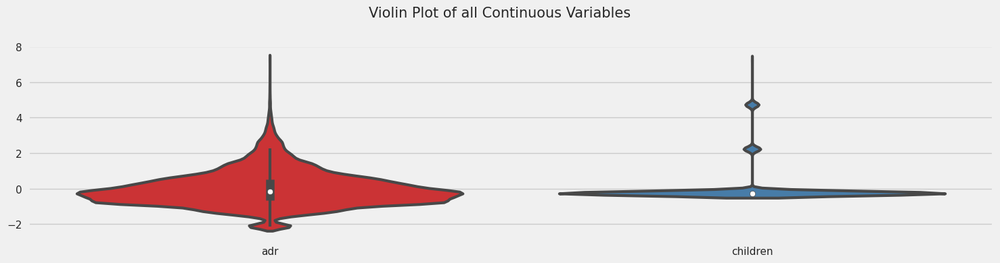

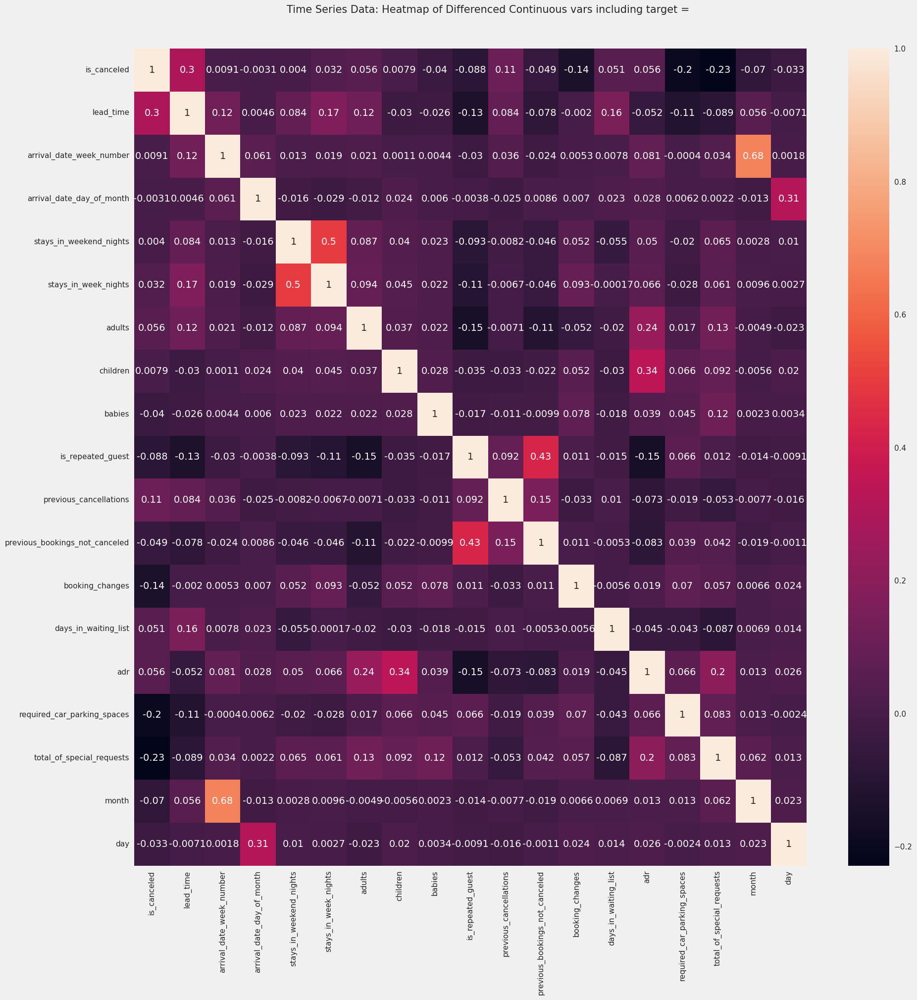

Could not draw Date Vars


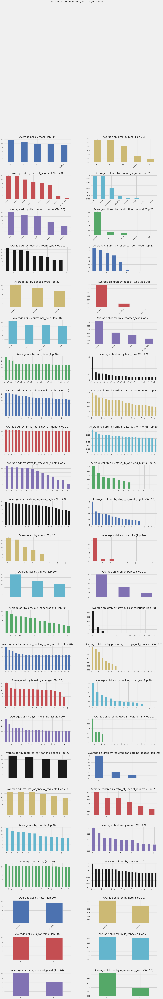

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

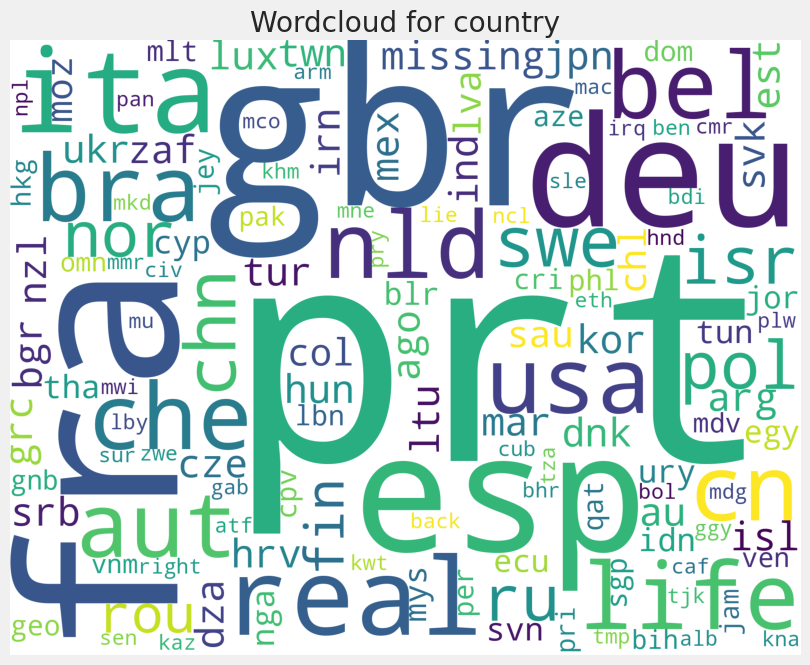

All Plots done
Time to run AutoViz = 67 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [31]:
autoviz_eda = AV.AutoViz('', dfte=df)

#**Preprocessing**#
Conclusions from the Preprocessing Notebook
No missing value or duplicate pre-processing needed

*   remove missing values and duplicate
*   drop useless column
*   Lable Encoded
*   Corrected for skewness
*   Winsorized outliers
*   SMOTE
*   Standardize










##Drop the missing values and duplicates

In [32]:

#from sklearn.preprocessing import LabelEncoder

# Assuming you have a dataframe called 'df' with a column named 'category' that you want to label encode
# encoder = LabelEncoder()
# df['category_encoded'] = encoder.fit_transform(df['category'])



In [33]:
df = df.dropna()

In [34]:
df.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests         0
year                              0
month                             0
day                         

In [35]:
df=df.drop_duplicates()


## Encoding







In [36]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'booking_changes', 'deposit_type', 'days_in_waiting_list',
       'customer_type', 'adr', 'required_car_parking_spaces',
       'total_of_special_requests', 'year', 'month', 'day'],
      dtype='object')

In [37]:
categorial_cols = [col for col in df.columns if df[col].dtype == 'O']
categorial_cols

['hotel',
 'meal',
 'country',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'deposit_type',
 'customer_type']

In [38]:
from sklearn.preprocessing import LabelEncoder
features_to_encode = ['hotel', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type', 'deposit_type', 'customer_type']

label_encoder = LabelEncoder()

for feature in features_to_encode:
    df[feature] = label_encoder.fit_transform(df[feature])

In [39]:
df

,hotel,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,year,month,day
429,1,0,57,29,15,0,2,2,0.0,0,1,105,4,1,0,0,0,0,0,0,0,3,107.0,0,0,2015,7,17
11165,1,1,203,17,25,0,2,2,0.0,0,2,105,4,3,0,0,0,0,0,0,0,3,90.0,0,0,2017,1,6
21043,1,0,83,7,9,2,5,2,0.0,0,0,45,5,3,0,0,0,0,0,0,0,2,26.0,0,0,2016,2,16
22591,1,0,0,42,10,1,0,1,0.0,0,0,105,6,3,1,0,0,0,0,0,0,3,56.0,0,1,2016,10,11
54136,0,1,187,28,7,0,2,0,2.0,0,0,45,6,3,0,0,0,1,0,0,0,3,86.5,0,0,2016,2,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90073,0,0,53,23,30,1,2,2,0.0,0,3,43,6,3,0,0,0,0,0,0,0,2,116.1,0,1,2016,6,2
118647,0,0,180,34,21,1,2,2,0.0,0,3,43,6,3,0,0,0,0,0,0,0,2,99.0,0,2,2017,8,24
15238,1,0,0,23,30,1,1,1,0.0,0,0,105,2,0,1,0,6,0,0,0,0,2,57.0,0,0,2016,6,1
113275,0,0,1,22,1,1,3,2,0.0,1,0,129,3,1,0,0,0,0,0,0,0,2,100.0,0,0,2017,6,5


##*Descriptive Statistics*

In [40]:
df.describe()

,hotel,is_canceled,lead_time,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,year,month,day
count,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000,24235.000000
mean,0.373262,0.295110,85.409078,26.929317,15.866309,0.997442,2.603218,1.870270,0.129276,0.010274,0.559893,67.330596,5.046214,2.541490,0.038333,0.042129,0.161667,1.200867,0.261358,0.033505,1.093419,2.079761,104.889061,0.075346,0.669899,2016.167403,6.274066,15.778255
std,0.483681,0.456102,90.949972,13.709585,8.833501,1.024577,2.017814,0.623272,0.440950,0.102466,1.081246,35.134442,1.324477,0.935641,0.192003,0.506864,1.623116,1.801673,0.707502,0.187810,12.325997,0.556490,50.526861,0.265512,0.825323,0.690718,3.256621,8.841255
min,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2014.000000,1.000000,1.000000
25%,0.000000,0.000000,13.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,39.000000,4.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,72.000000,0.000000,0.000000,2016.000000,3.000000,8.000000
50%,0.000000,0.000000,54.000000,27.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,56.000000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,96.600000,0.000000,0.000000,2016.000000,6.000000,16.000000
75%,1.000000,1.000000,132.000000,38.000000,24.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,105.000000,6.000000,3.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,2.000000,130.500000,0.000000,1.000000,2017.000000,9.000000,23.000000
max,1.000000,1.000000,629.000000,53.000000,31.000000,13.000000,32.000000,40.000000,3.000000,2.000000,4.000000,132.000000,6.000000,4.000000,1.000000,26.000000,68.000000,8.000000,18.000000,2.000000,391.000000,3.000000,450.000000,3.000000,5.000000,2017.000000,12.000000,31.000000


##Split Predictors and Target

In [41]:
X = pd.DataFrame(df.drop(['is_canceled'],axis=1))
y = pd.DataFrame(df['is_canceled']) 


In [42]:
print(y.isna().sum())
X.isna().sum().sum()


is_canceled    0
dtype: int64


0

##Outliers & Skewness correction

In [43]:
# -*- coding: utf-8 -*-
"""
Created on Sat Feb 23 14:42:46 2019
@author: DATAmadness
"""

##################################################
# A function that will accept a pandas dataframe
# and auto-transforms columns that exceeds threshold value
#  -  Offers choice between boxcox or log / exponential transformation
#  -  Automatically handles negative values
#  -  Auto recognizes positive /negative skewness

# Further documentation available here:
# https://datamadness.github.io/Skewness_Auto_Transform




import seaborn as sns
import numpy as np
import math
import scipy.stats as ss
import matplotlib.pyplot as plt

def skew_autotransform(DF, include = None, exclude = None, plot = False, threshold = 1, exp = False):
    
    #Get list of column names that should be processed based on input parameters
    if include is None and exclude is None:
        colnames = DF.columns.values
    elif include is not None:
        colnames = include
    elif exclude is not None:
        colnames = [item for item in list(DF.columns.values) if item not in exclude]
    else:
        print('No columns to process!')
    
    #Helper function that checks if all values are positive
    def make_positive(series):
        minimum = np.amin(series)
        #If minimum is negative, offset all values by a constant to move all values to positive teritory
        if minimum <= 0:
            series = series + abs(minimum) + 0.01
        return series
    
    
    #Go throug desired columns in DataFrame
    for col in colnames:
        #Get column skewness
        skew = DF[col].skew()
        transformed = True
        
        if plot:
            #Prep the plot of original data
            sns.set_style("darkgrid")
            sns.set_palette("Blues_r")
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            ax1 = sns.distplot(DF[col], ax=axes[0])
            ax1.set(xlabel='Original ' + col)
        
        #If skewness is larger than threshold and positively skewed; If yes, apply appropriate transformation
        if abs(skew) > threshold and skew > 0:
            skewType = 'positive'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply log transformation 
               DF[col] = DF[col].apply(math.log)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
         
        elif abs(skew) > threshold and skew < 0:
            skewType = 'negative'
            #Make sure all values are positive
            DF[col] = make_positive(DF[col])
            
            if exp:
               #Apply exp transformation 
               DF[col] = DF[col].pow(10)
            else:
                #Apply boxcox transformation
                DF[col] = ss.boxcox(DF[col])[0]
            skew_new = DF[col].skew()
        
        else:
            #Flag if no transformation was performed
            transformed = False
            skew_new = skew
        
        #Compare before and after if plot is True
        if plot:
            print('\n ------------------------------------------------------')     
            if transformed:
                print('\n %r had %r skewness of %2.2f' %(col, skewType, skew))
                print('\n Transformation yielded skewness of %2.2f' %(skew_new))
                sns.set_palette("Paired")
                ax2 = sns.distplot(DF[col], ax=axes[1], color = 'r')
                ax2.set(xlabel='Transformed ' + col)
                plt.show()
            else:
                print('\n NO TRANSFORMATION APPLIED FOR %r . Skewness = %2.2f' %(col, skew))
                ax2 = sns.distplot(DF[col], ax=axes[1])
                ax2.set(xlabel='NO TRANSFORM ' + col)
                plt.show()
                

    return DF


In [44]:
quant_features

['hotel',
 'adr',
 'booking_changes',
 'adults',
 'day',
 'children',
 'stays_in_weekend_nights',
 'previous_cancellations',
 'month',
 'babies',
 'total_of_special_requests',
 'lead_time',
 'arrival_date_day_of_month',
 'arrival_date_week_number',
 'days_in_waiting_list',
 'previous_bookings_not_canceled',
 'stays_in_week_nights',
 'year',
 'is_repeated_guest',
 'required_car_parking_spaces']

In [45]:
#items_to_remove = ['reservation_status_date', 'arrival_date_day_of_month']

#for item in items_to_remove:
    #quant_features.remove(item)

#print(quant_features)


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'hotel' . Skewness = 0.52


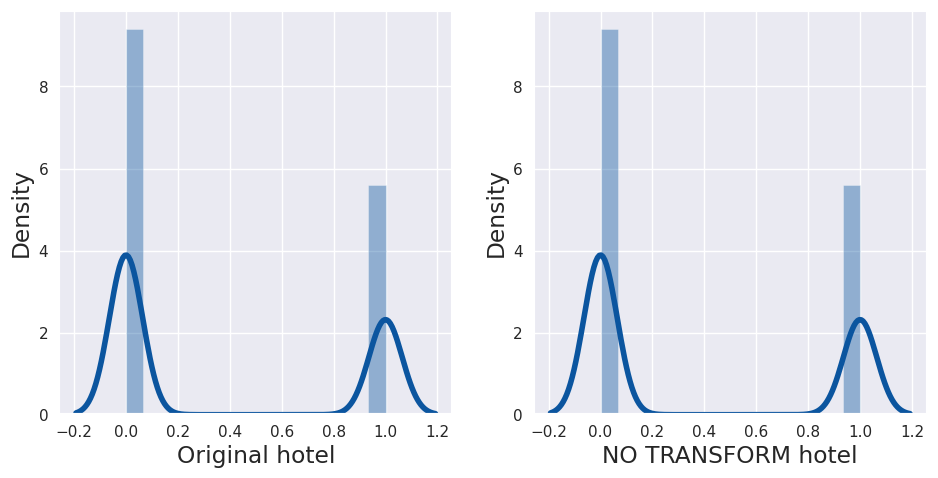


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'adr' . Skewness = 0.87


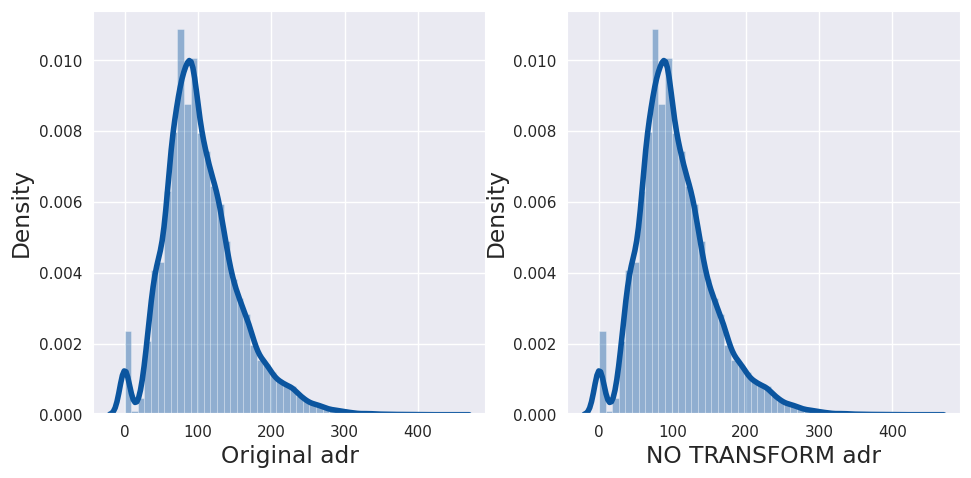


 ------------------------------------------------------

 'booking_changes' had 'positive' skewness of 5.34

 Transformation yielded skewness of 1.74


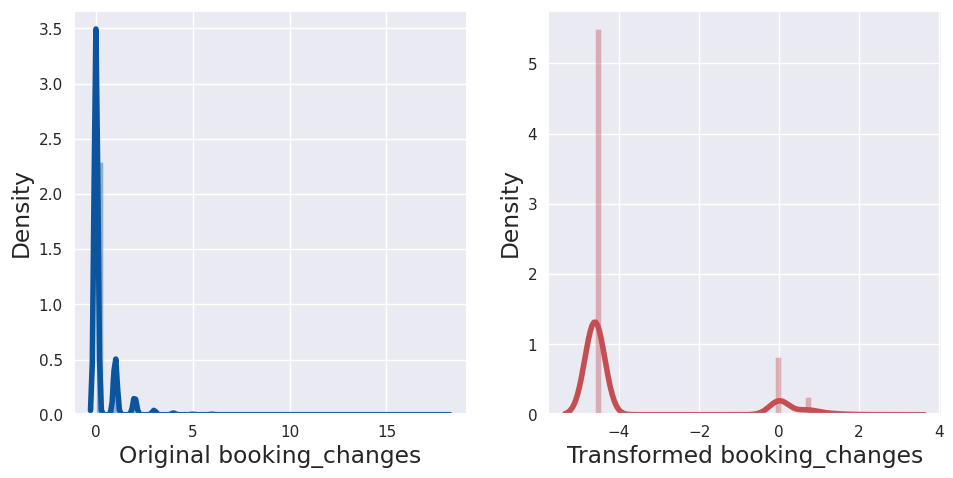


 ------------------------------------------------------

 'adults' had 'positive' skewness of 16.72

 Transformation yielded skewness of -6.55


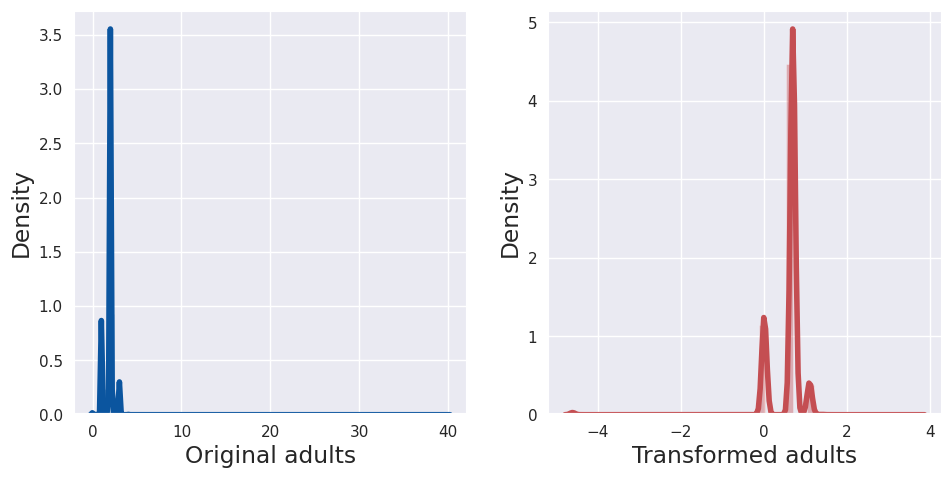


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'day' . Skewness = 0.00


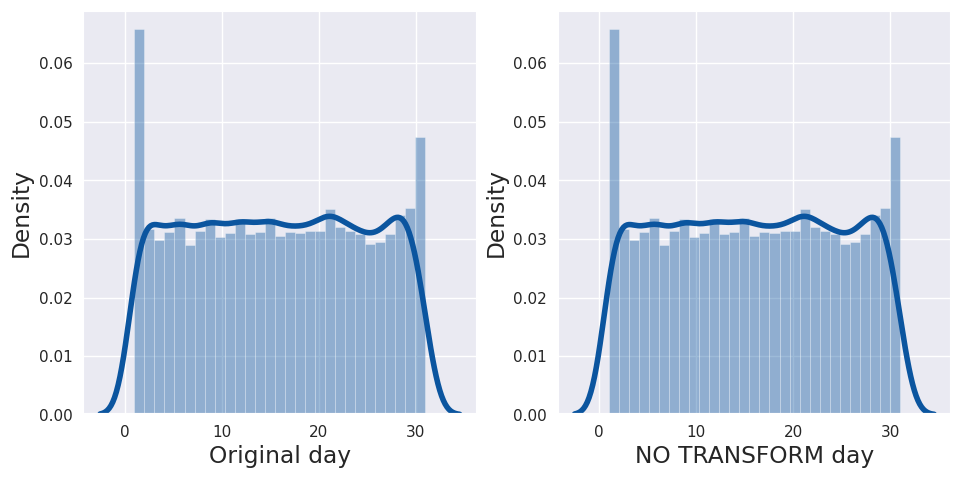


 ------------------------------------------------------

 'children' had 'positive' skewness of 3.51

 Transformation yielded skewness of 2.92


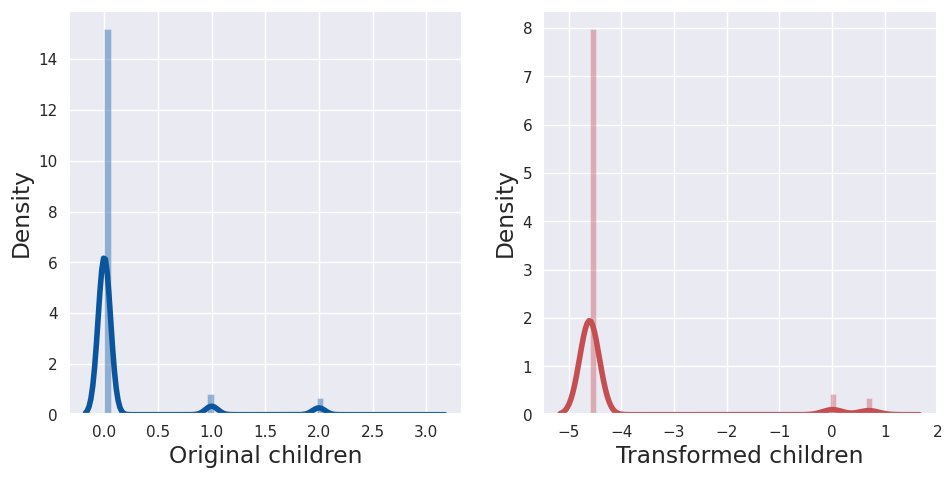


 ------------------------------------------------------

 'stays_in_weekend_nights' had 'positive' skewness of 1.28

 Transformation yielded skewness of -0.34


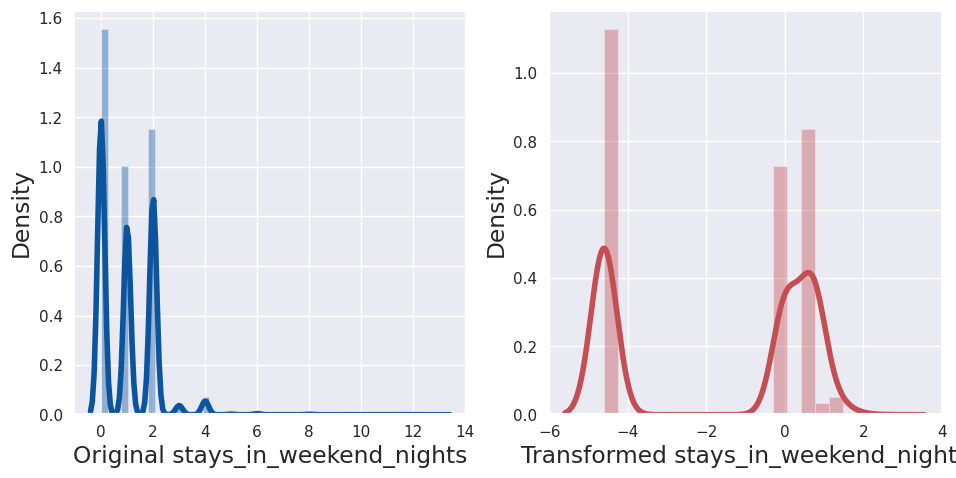


 ------------------------------------------------------

 'previous_cancellations' had 'positive' skewness of 33.23

 Transformation yielded skewness of 6.12


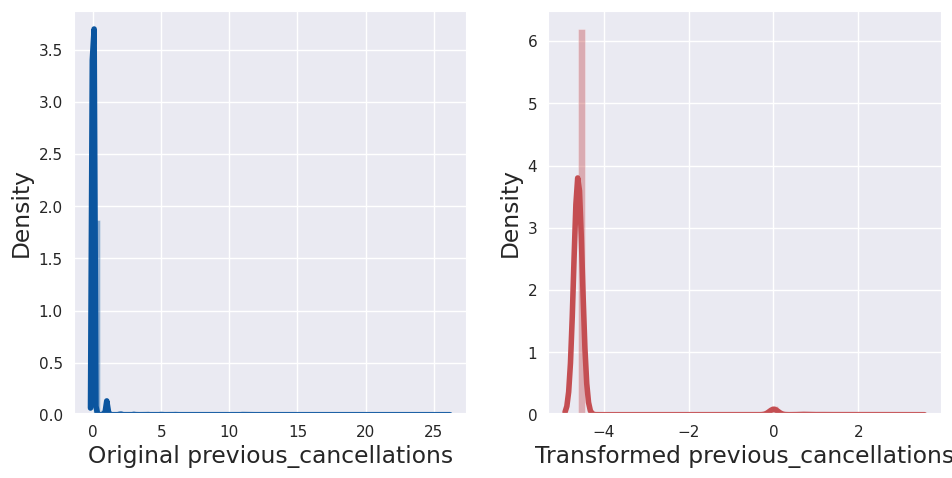


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'month' . Skewness = 0.05


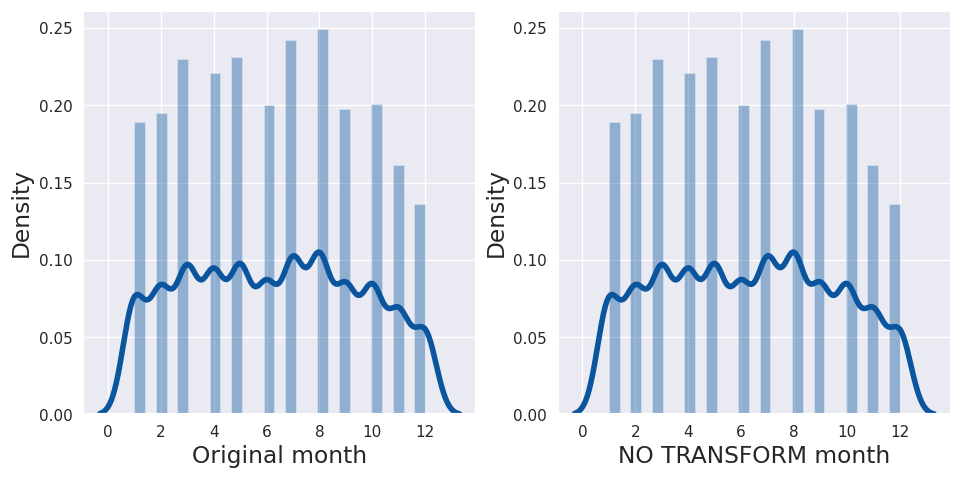


 ------------------------------------------------------

 'babies' had 'positive' skewness of 10.17

 Transformation yielded skewness of 9.80


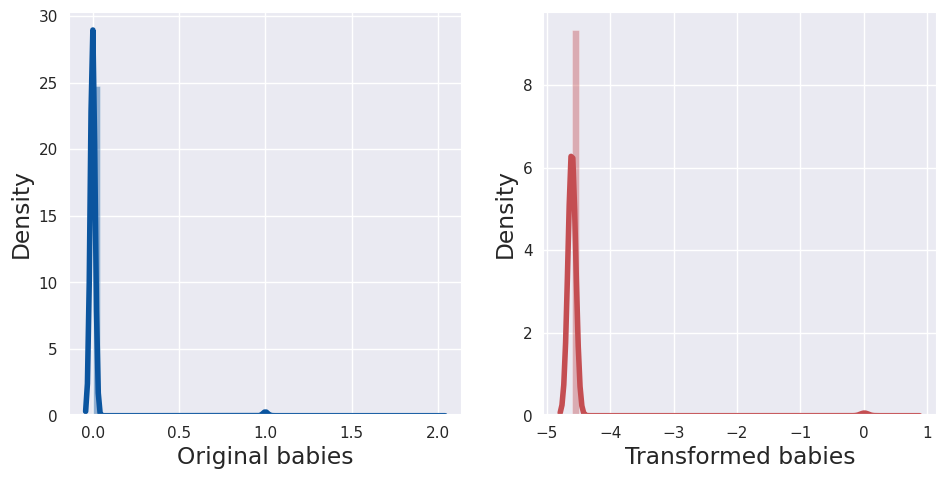


 ------------------------------------------------------

 'total_of_special_requests' had 'positive' skewness of 1.13

 Transformation yielded skewness of 0.12


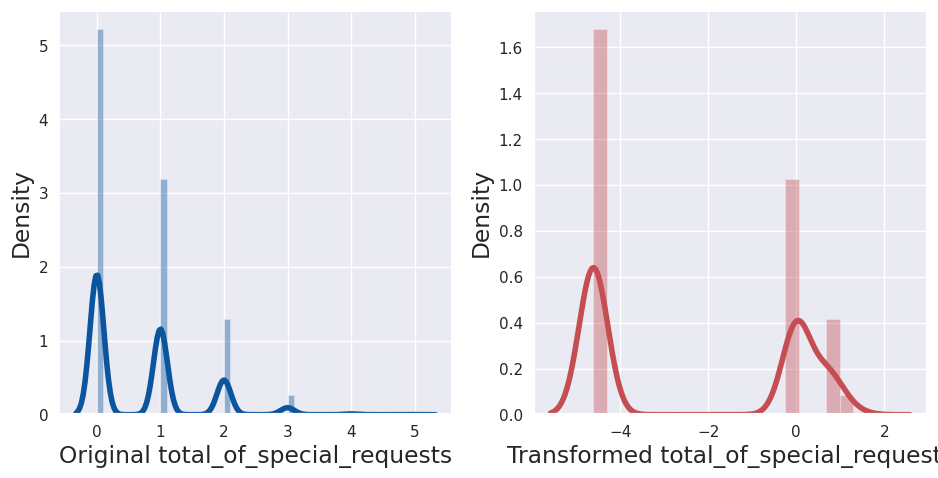


 ------------------------------------------------------

 'lead_time' had 'positive' skewness of 1.47

 Transformation yielded skewness of -1.94


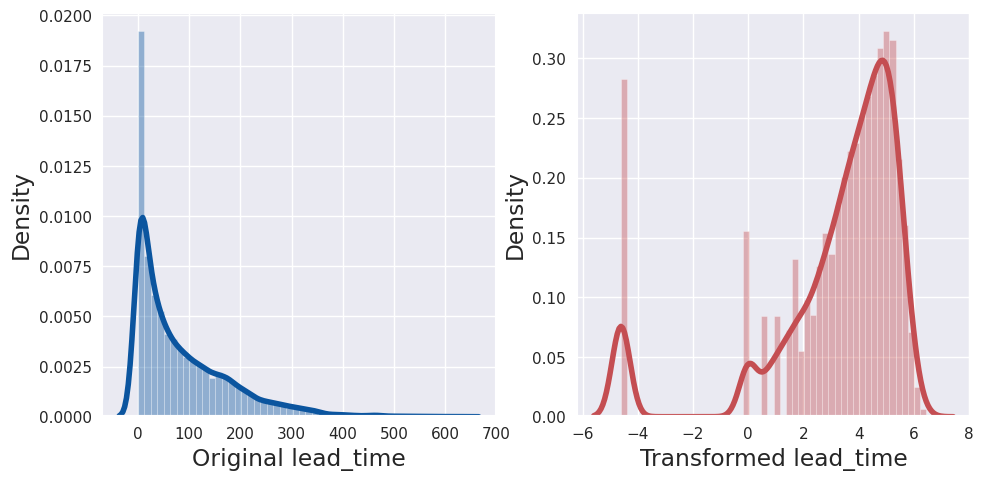


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'arrival_date_day_of_month' . Skewness = -0.00


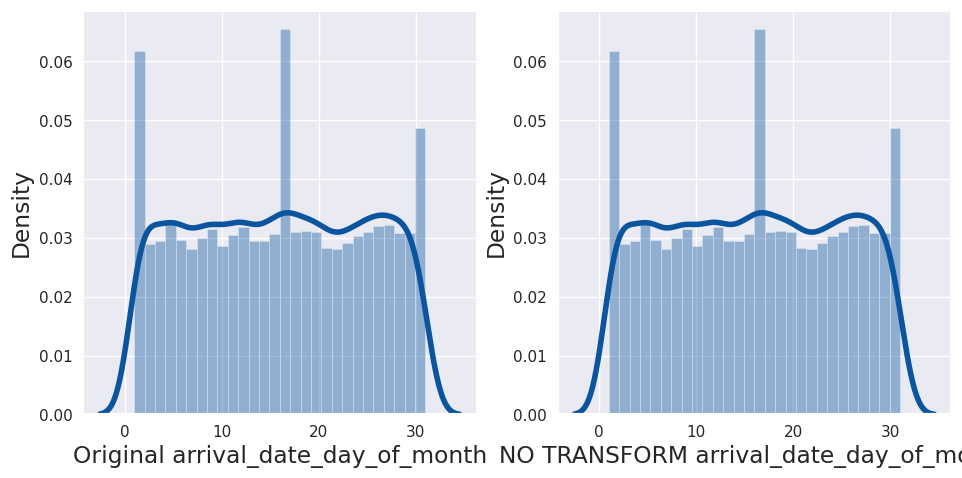


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'arrival_date_week_number' . Skewness = 0.02


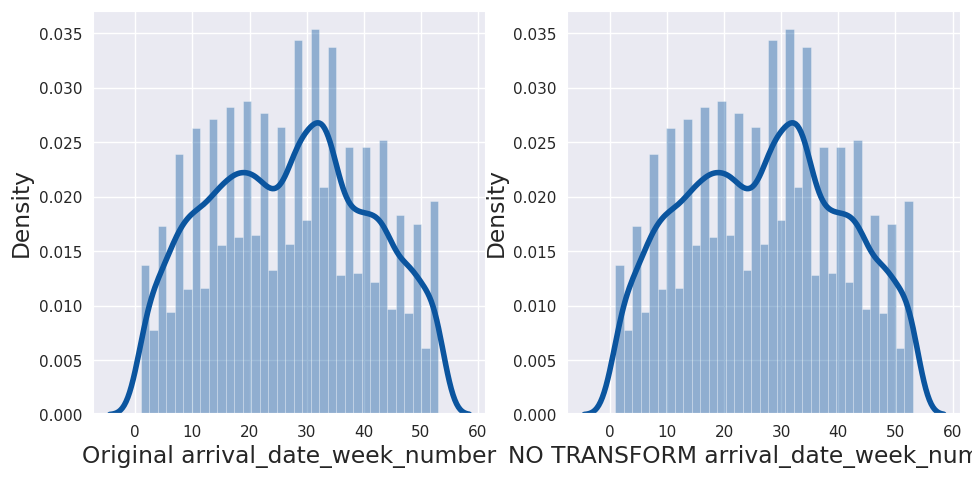


 ------------------------------------------------------

 'days_in_waiting_list' had 'positive' skewness of 16.59

 Transformation yielded skewness of 8.42


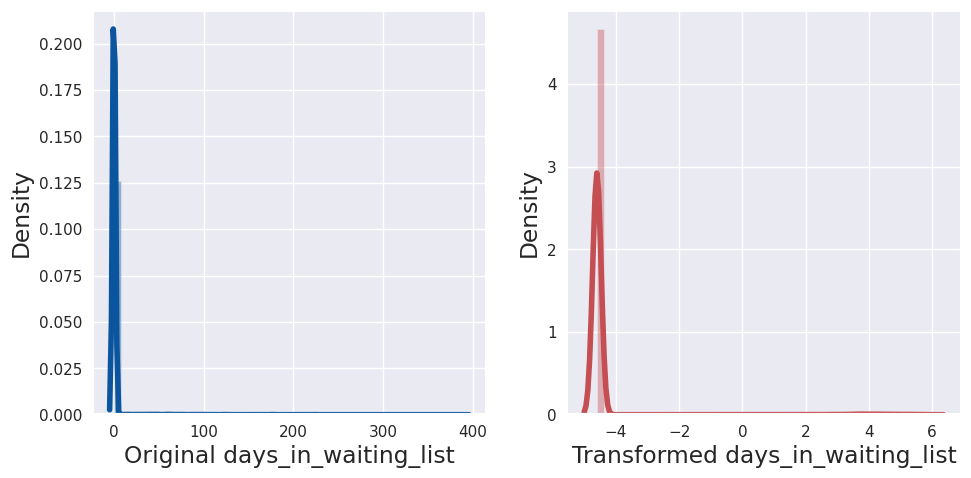


 ------------------------------------------------------

 'previous_bookings_not_canceled' had 'positive' skewness of 21.69

 Transformation yielded skewness of 5.25


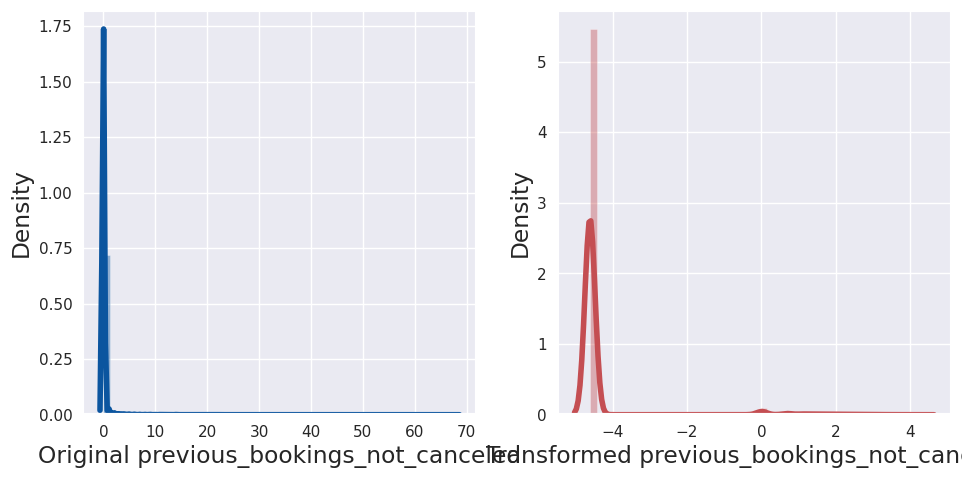


 ------------------------------------------------------

 'stays_in_week_nights' had 'positive' skewness of 2.44

 Transformation yielded skewness of -2.49


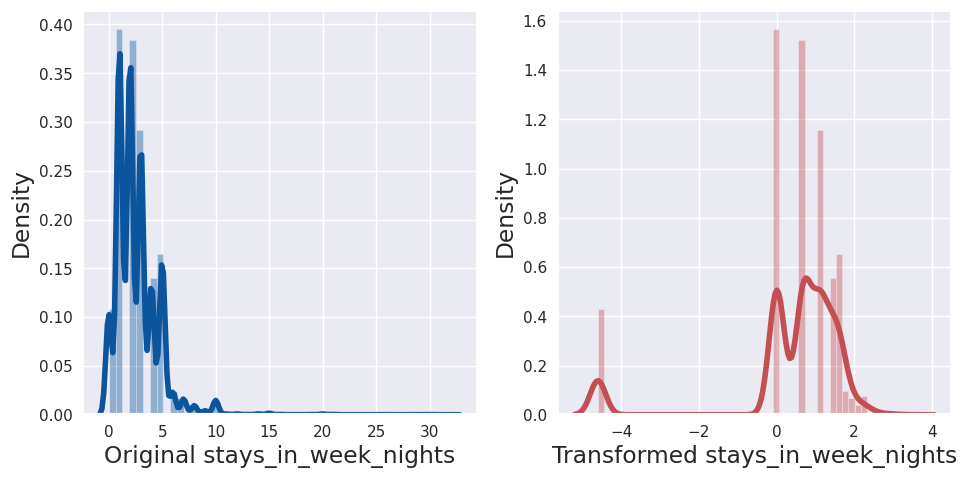


 ------------------------------------------------------

 NO TRANSFORMATION APPLIED FOR 'year' . Skewness = -0.24


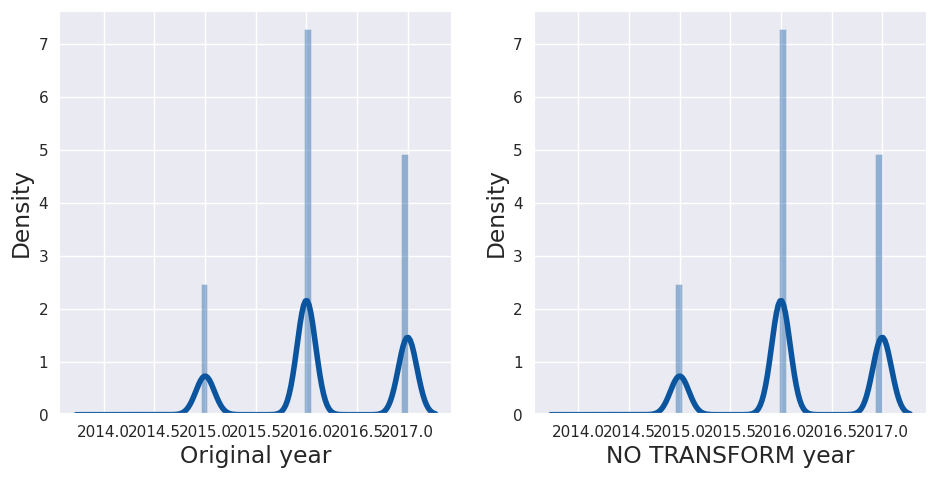


 ------------------------------------------------------

 'is_repeated_guest' had 'positive' skewness of 4.81

 Transformation yielded skewness of 4.81


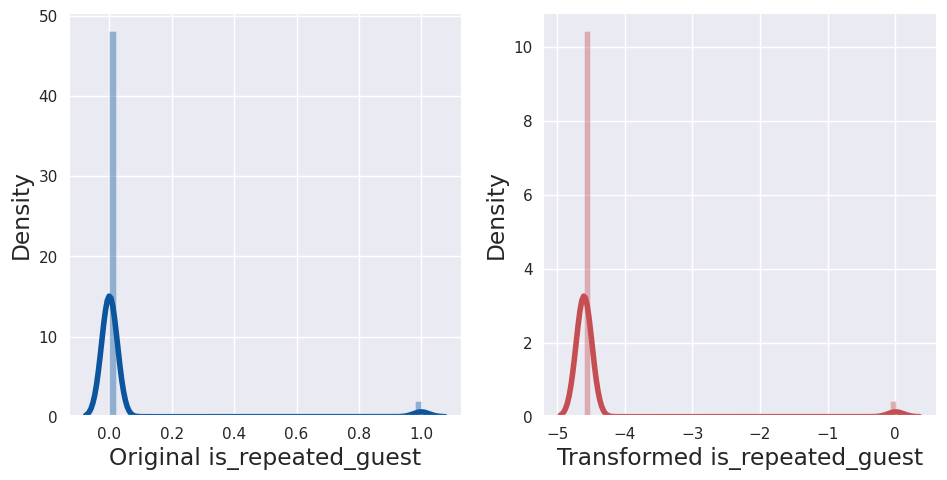


 ------------------------------------------------------

 'required_car_parking_spaces' had 'positive' skewness of 3.30

 Transformation yielded skewness of 3.23


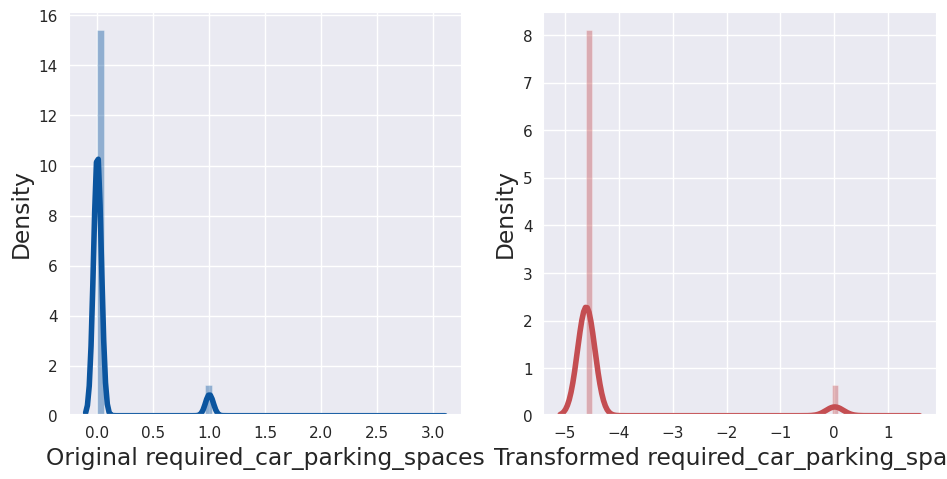

In [46]:
X= skew_autotransform(X.copy(deep=True), include=quant_features,plot = True, exp = True, threshold = 1)

In [47]:
# another method to fix outliers

#for i in quant_features:
  #quantiles = X[i].quantile([0.05,0.95]).values
  #print(i,quantiles,'\n\n')
  #X[i][X[i] <= quantiles[0]] = quantiles[0]
  #X[i][X[i] >= quantiles[1]] = quantiles[1]

In [ ]:

cols = X.columns
#Tukey's method
def tukey_rule(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_lim = data[col].quantile(0.5) + 2 * IQR
    lower_lim = data[col].quantile(0.5) - 2 * IQR
    outliers = []
    for index, x in enumerate(data[col]):
        if x < lower_lim or x >= upper_lim:
            outliers.append(index)
    return outliers

# Identify outliers
for i in cols:
  outliers_Tukey = tukey_rule(X,i)
  print("Column ",i,": ",outliers_Tukey)
  
# Windsorize X and check the results
print("Before", X.describe())
X_winsorized = X.copy(deep=True)
for i in cols:
  X_winsorized[i] = winsorize(X[i], limits=(0.05, 0.05))
print("After", X_winsorized.describe())


for i in cols:
  ax = sns.boxplot(data=X_winsorized[[i]], orient="h", palette="Set2")
  plt.show()

##*Training & Test Datasets*

In [49]:

# Split data into training and test data
X_winsorized_train, X_winsorized_test, y_train, y_test = train_test_split(X_winsorized, y, test_size=0.25, random_state=54321, stratify=y)
# Shape of x1_train
X_winsorized_train.shape


(18176, 27)

In [50]:
y_train.shape

(18176, 1)

In [51]:
y_test

,is_canceled
47542,1
10064,1
32929,0
42083,0
108875,0
...,...
114172,0
82686,0
113250,0
88457,0


## Standardize training data


In [52]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.datasets import make_classification
sm = SMOTE()
X_winsorized_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_winsorized_train, y_train)
stdsc = StandardScaler()  
X_winsorized_train_SMOTE_std = pd.DataFrame(stdsc.fit_transform(X_winsorized_train_SMOTE),columns=X_winsorized_train_SMOTE.columns)
X_test_std = pd.DataFrame(stdsc.transform(X_winsorized_test),columns=X_winsorized_train_SMOTE.columns)   


#***Strength of Predictors***

###*Principal Components Analysis (PCA)*

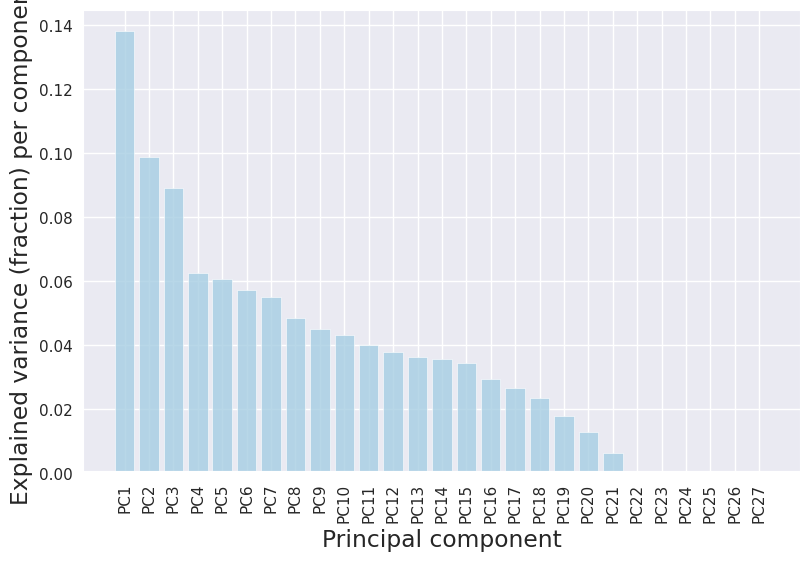

In [53]:
# Principal Components Analysis
# Examine the explained variance ratio in order for each components
pca = PCA()
X_winsorized_train_SMOTE_std_pca = pca.fit_transform(X_winsorized_train_SMOTE_std)
pca.explained_variance_ratio_

pca_explained_variance_bar(pca, alpha=0.8)
plt.show()

###*Feature Importance*

<BarContainer object of 27 artists>

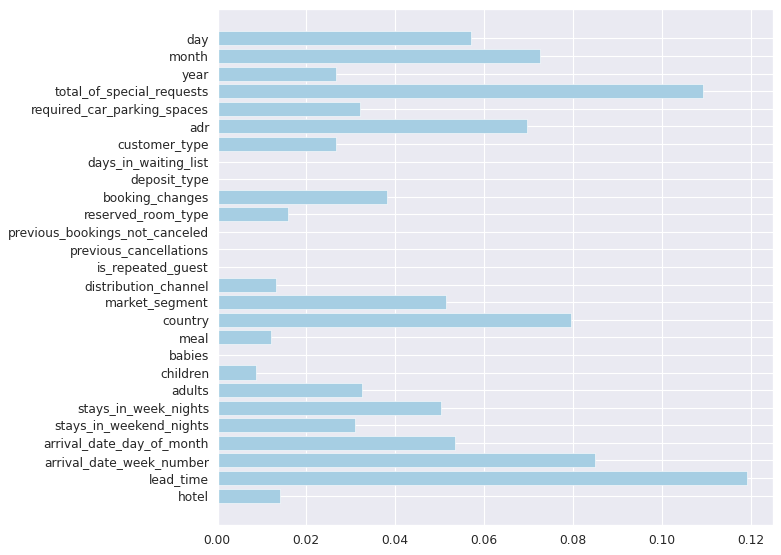

In [54]:
from sklearn.ensemble import RandomForestClassifier
#from sklearn.inspection import permutation_importance
rf = RandomForestClassifier()
from matplotlib.pyplot import figure
col_names = X_winsorized_train_SMOTE_std.columns
rf.fit(X_winsorized_train_SMOTE_std, y_train_SMOTE)
figure(figsize=(8, 8), dpi=80)
plt.barh(col_names, rf.feature_importances_)

###*Recursive Feature Importance (RFE)*

In [55]:
from sklearn.feature_selection import RFE
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=5)
_ = rfe.fit(X_winsorized_train_SMOTE_std,y_train_SMOTE)
print('Important Features\n',X.columns[rfe.support_])
rf = RandomForestClassifier()
_ = rf.fit(rfe.transform(X_winsorized_train_SMOTE_std), y_train_SMOTE)
print("\n Accuracy: ",rf.score(rfe.transform(X_winsorized_train_SMOTE_std), y_train_SMOTE))

Important Features
 Index(['lead_time', 'arrival_date_week_number', 'arrival_date_day_of_month',
       'month', 'day'],
      dtype='object')

 Accuracy:  0.9989853262566344


#*Low-Code (PyCaret)*

,Description,Value
0,Session id,1974
1,Target,is_canceled
2,Target type,Binary
3,Original data shape,"(25624, 28)"
4,Transformed data shape,"(25624, 6)"
5,Transformed train set shape,"(17936, 6)"
6,Transformed test set shape,"(7688, 6)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9809,0.9988,0.9648,0.9970,0.9806,0.9619,0.9624,0.5480
xgboost,Extreme Gradient Boosting,0.9866,0.9986,0.9777,0.9953,0.9864,0.9731,0.9733,1.7060
catboost,CatBoost Classifier,0.9828,0.9986,0.9692,0.9963,0.9826,0.9657,0.9660,7.3540
rf,Random Forest Classifier,0.9770,0.9976,0.9595,0.9942,0.9766,0.9539,0.9545,1.6560
et,Extra Trees Classifier,0.9816,0.9973,0.9699,0.9932,0.9814,0.9632,0.9635,1.3720
gbc,Gradient Boosting Classifier,0.9260,0.9816,0.8624,0.9883,0.9209,0.8520,0.8591,1.6880
knn,K Neighbors Classifier,0.9458,0.9808,0.8992,0.9915,0.9431,0.8915,0.8954,0.3600
dt,Decision Tree Classifier,0.9688,0.9694,0.9556,0.9817,0.9684,0.9377,0.9381,0.2000
qda,Quadratic Discriminant Analysis,0.7514,0.8266,0.6096,0.8503,0.7097,0.5028,0.5243,0.2020
ada,Ada Boost Classifier,0.7254,0.7717,0.6402,0.7906,0.7015,0.4507,0.4657,0.6880


Processing:   0%|          | 0/69 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9716,0.9976,0.9521,0.9907,0.9710,0.9431,0.9439
1,0.9727,0.9970,0.9565,0.9885,0.9722,0.9454,0.9459
2,0.9777,0.9969,0.9610,0.9942,0.9773,0.9554,0.9559
3,0.9780,0.9973,0.9632,0.9925,0.9777,0.9560,0.9564
4,0.9465,0.9795,0.9142,0.9774,0.9447,0.8929,0.8948
Mean,0.9693,0.9937,0.9494,0.9887,0.9686,0.9386,0.9394
Std,0.0117,0.0071,0.0180,0.0060,0.0122,0.0234,0.0228


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 5 folds for each of 10 candidates, totalling 50 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

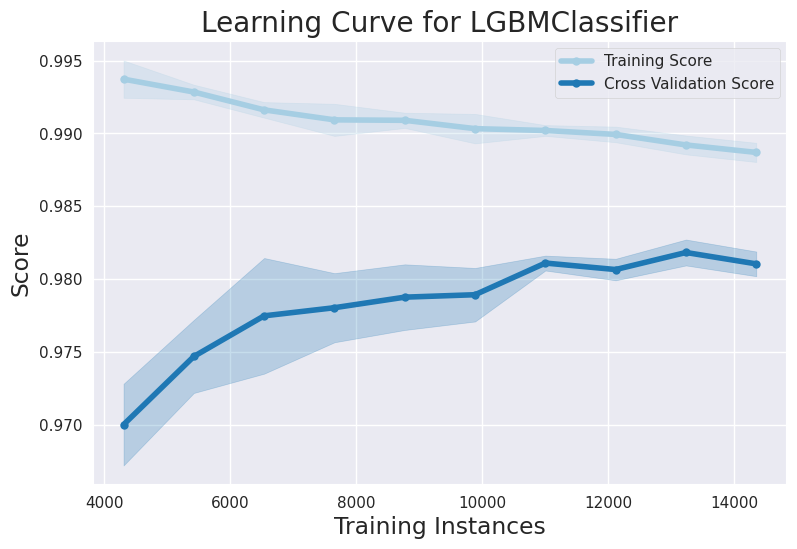

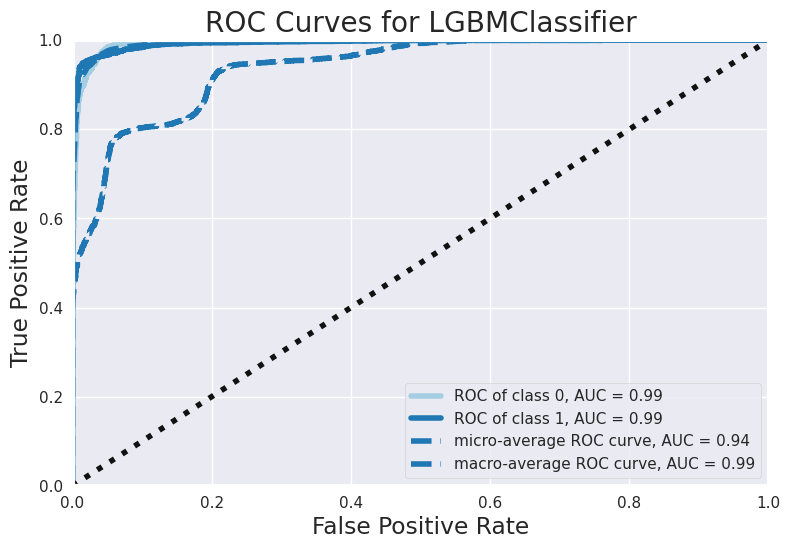

In [56]:
#Low-Code PyCaret code
# Combine the predictor dataframe X and target dataframe y to get df
df1 = pd.concat([X_winsorized_train_SMOTE_std,y_train_SMOTE], axis=1)

# Initialize PyCaret
clf = setup(data=df1, target='is_canceled',fold=5,
                   numeric_features=quant_features, normalize=True,feature_selection= True
                   )

# Compare multiple models and select the best one
best_model = compare_models(sort='AUC')

# Tune the model using a grid search
tuned_model = tune_model(best_model)

# Evaluate the performance of the tuned model
evaluate_model(tuned_model)

# Train the best model on the entire dataset
final_model = finalize_model(tuned_model)

# plot learning curve
plot_model(final_model, plot='learning') 
# # Interpret final_model and plot the AUC curve
plot_model(final_model, plot='auc')



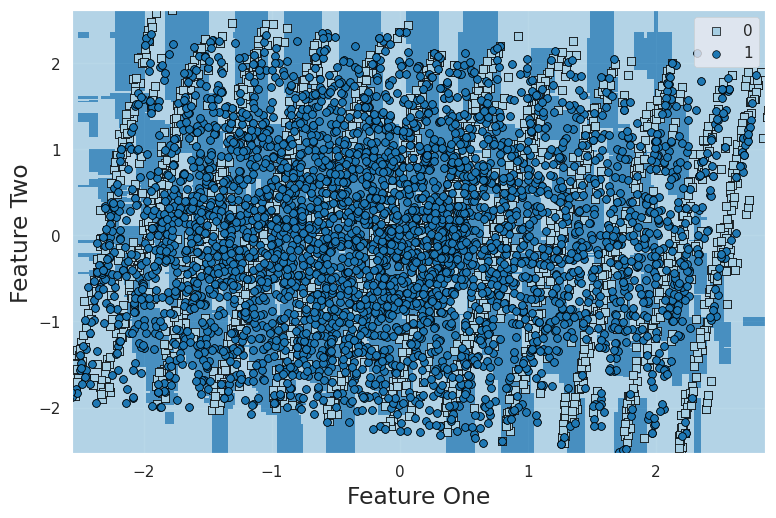

In [57]:
# Decision boundary using low-code
plot_model(tuned_model, plot = 'boundary', use_train_data = True)

#**Classification**

In [58]:
# select Feature from XAI(After we used every feature to run one time)
X_winsorized=X_winsorized[['lead_time','total_of_special_requests','month','adr','country','arrival_date_week_number','day','market_segment','stays_in_week_nights','arrival_date_day_of_month']]

##*Classifier Horse Race*

In [59]:
# Workflow standardizes, SMOTEs training set, fits a classifier, and reports metrics.
# SMOTE evidently doesn't have a 'fit_transform' method, so there's no way to incorporate it into an sklearn pipeline
# We'll consider an alternative - an imblearn pipeline in the gridsearch section

names = ["Perceptron", "Logistic Regression", "SVM (RBF kernel)", "Decision Tree", "Naive Bayes", "k Nearest Neighbors"
, "MLP", "Random Forest", "XG Boost", "Light GBM"]
classifiers = [
    Perceptron(random_state=1),    
    LogisticRegression(),   
    SVC(kernel="rbf", C=1),
    DecisionTreeClassifier(max_depth=5),
    GaussianNB(),
    KNeighborsClassifier(3),
    MLPClassifier(hidden_layer_sizes=(50,50),alpha=1, max_iter=1000),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    XGBClassifier(random_state=0, n_jobs=-1, learning_rate=0.1, n_estimators=100, max_depth=3),
    LGBMClassifier(boosting_type='gbdt', objective='binary', num_leaves=50, learning_rate=0.1, bagging_fraction=0.9, feature_fraction=0.9, reg_lambda=0.2)]

# Build each classifier using the unbalanced TRAINING data, show decision region and petrformance of the unbalanced TEST data 
no_folds = 5 # number of folds desired for cross validation
kf = StratifiedKFold(n_splits=no_folds, shuffle=True, random_state=12345)
for name, clf in zip(names, classifiers):
  print('CLASSIFIER: ',name,'\n')
  mean_accuracy = 0.0
  mean_balanced_accuracy = 0.0
  mean_auc = 0.0
  for fold, (train_index, test_index) in enumerate(kf.split(X_winsorized,y),1):
    X_train, X_test = X.iloc[list(train_index)], X.iloc[list(test_index)]
    y_train, y_test = y.iloc[list(train_index)], y.iloc[list(test_index)] 
    sm = SMOTE()
    X_train_SMOTE, y_train_SMOTE = sm.fit_resample(X_train, y_train)
    stdsc = StandardScaler()  
    X_train_SMOTE_std = stdsc.fit_transform(X_train_SMOTE)   
    X_test_std = stdsc.transform(X_test)   
    clf.fit(X_train_SMOTE_std, y_train_SMOTE) 
    y_pred = clf.predict(X_test_std)
    print(f'For fold {fold}:')
    print(f'Accuracy: {clf.score(X_test_std, y_test)}')
    print(f'Balanced Accuracy: {balanced_accuracy_score(y_test, y_pred)}')
    print(f'AUC: {roc_auc_score(y_test, y_pred)}')
    mean_accuracy = mean_accuracy + clf.score(X_test_std, y_test)
    mean_balanced_accuracy = mean_balanced_accuracy + balanced_accuracy_score(y_test, y_pred)
    mean_auc = mean_auc + roc_auc_score(y_test, y_pred)
  mean_accuracy = mean_accuracy / no_folds
  mean_balanced_accuracy = mean_balanced_accuracy / no_folds
  mean_auc = mean_auc / no_folds
  print('Average accuracy: %.3f Average balanced accuracy: %.3f Average AUC: %.3f\n\n' % (mean_accuracy, mean_balanced_accuracy, mean_auc))

CLASSIFIER:  Perceptron 

For fold 1:
Accuracy: 0.709717350938725
Balanced Accuracy: 0.6894062185984926
AUC: 0.6894062185984926
For fold 2:
Accuracy: 0.7297297297297297
Balanced Accuracy: 0.666188493976027
AUC: 0.666188493976027
For fold 3:
Accuracy: 0.6661852692387044
Balanced Accuracy: 0.6861831320567053
AUC: 0.6861831320567053
For fold 4:
Accuracy: 0.7045595213534145
Balanced Accuracy: 0.6651249228770106
AUC: 0.6651249228770107
For fold 5:
Accuracy: 0.7223024551268826
Balanced Accuracy: 0.6892857961138197
AUC: 0.6892857961138197
Average accuracy: 0.706 Average balanced accuracy: 0.679 Average AUC: 0.679


CLASSIFIER:  Logistic Regression 

For fold 1:
Accuracy: 0.7317928615638539
Balanced Accuracy: 0.7229556659319609
AUC: 0.7229556659319609
For fold 2:
Accuracy: 0.74169589436765
Balanced Accuracy: 0.7342491573395875
AUC: 0.7342491573395875
For fold 3:
Accuracy: 0.7398390757169383
Balanced Accuracy: 0.73557541375803
AUC: 0.73557541375803
For fold 4:
Accuracy: 0.7464410975861357
Balan

##*Gridsearch LGBM Classifier*








In [60]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline as imbpipeline
from imblearn.over_sampling import SMOTE
import lightgbm as lgb

# create pipeline with SMOTE and StandardScaler
pipeline = imbpipeline([
        ('sample', SMOTE()),
        ('std', StandardScaler()),
        ('reg', lgb.LGBMClassifier())
])

# define hyperparameters to tune
param_grid = {
    'reg__n_estimators': [100, 200, 300],
    'reg__learning_rate': [0.01, 0.1, 0.5],
    'reg__max_depth': [3, 5, 7],
    'reg__subsample': [0.5, 0.8, 1],
    'reg__colsample_bytree': [0.5, 0.8, 1]
}

# define grid search object
grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# fit grid search object to data
grid_search.fit(X_train_SMOTE_std, y_train_SMOTE)

# print best hyperparameters and corresponding score
print("Best hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)



Best hyperparameters:  {'reg__colsample_bytree': 1, 'reg__learning_rate': 0.5, 'reg__max_depth': 7, 'reg__n_estimators': 300, 'reg__subsample': 0.8}
Best score:  -0.0073898535409643775


In [61]:
print(grid_search.best_estimator_)

Pipeline(memory=None,
         steps=[('sample',
                 SMOTE(k_neighbors=5, n_jobs=None, random_state=None,
                       sampling_strategy='auto')),
                ('std',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('reg',
                 LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=1, importance_type='split',
                                learning_rate=0.5, max_depth=7,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=300, n_jobs=-1,
                                num_leaves=31, objective=None,
                                random_state=None, reg_alpha=0.0,
                                reg_lambda=0.0, silent='warn', subsample=0.8,
                                subsample_for_bin=200000, subsample_freq=0))],
         verbose=False)


In [62]:
!pip install scikit-plot
import scikitplot as skplt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


##*LGBM Learning Curves*

In [63]:
from sklearn.model_selection import learning_curve
from lightgbm import LGBMClassifier

Test Mean:  [0.99107437 0.99297635 0.99374465 0.99506181 0.99480585]


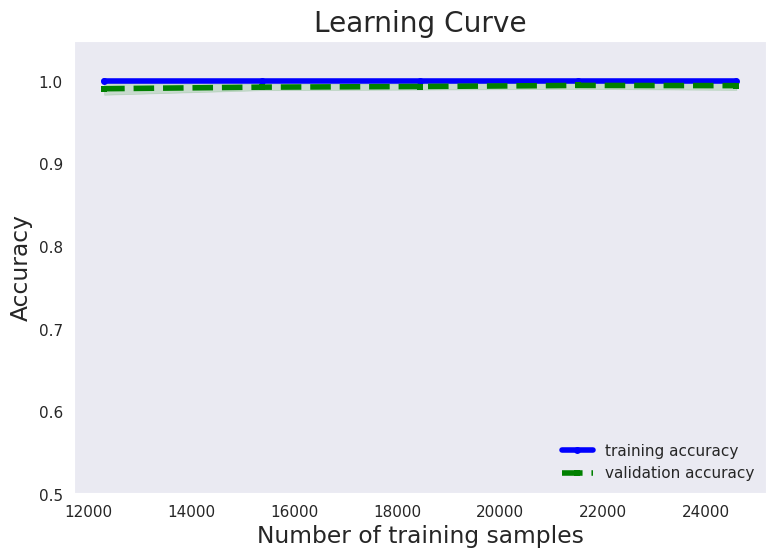

In [64]:


clf = imbpipeline([
        ('sample', SMOTE()),
        ('std', StandardScaler()),
        ('clf', LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=0.8, importance_type='split',
                                learning_rate=0.5, max_depth=7,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=200, n_jobs=-1,
                                num_leaves=31, objective=None,
                                random_state=None, reg_alpha=0.0,
                                reg_lambda=0.0, silent='warn', subsample=1,
                                subsample_for_bin=200000, subsample_freq=0))])

train_sizes, train_scores, test_scores = learning_curve(estimator=clf,
                               X=X_train_SMOTE_std,
                               y=y_train_SMOTE,
                               train_sizes=np.linspace(0.5, 1.0, 5),
                               cv=10,
                               n_jobs=1)

train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)


print('Test Mean: ',test_mean)
plt.plot(train_sizes, train_mean,
         color='blue', marker='o',
         markersize=5, label='training accuracy')

plt.fill_between(train_sizes,
                 train_mean + train_std,
                 train_mean - train_std,
                 alpha=0.15, color='blue')

plt.plot(train_sizes, test_mean,
         color='green', linestyle='--',
         marker='s', markersize=5,
         label='validation accuracy')

plt.fill_between(train_sizes,
                 test_mean + test_std,
                 test_mean - test_std,
                 alpha=0.15, color='green')

plt.grid()
plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.ylim([0.5, 1.05])
plt.tight_layout()
plt.title('Learning Curve')
# plt.savefig('./figures/learning_curve.png', dpi=300)
%matplotlib inline
plt.show()


## LGBM AUC and Accuracy after grid search


In [65]:
clf.fit(X_train_SMOTE_std,y_train_SMOTE)
y_pred = clf.predict(X_test_std)
print(f'AUC: {roc_auc_score(y_test, y_pred)}')
print(f'Accuracy: {clf.score(X_test_std, y_test)}')

AUC: 0.995311351849397
Accuracy: 0.9971116154322262


## confusion Matrix

In [66]:
print(confusion_matrix(y_test, y_pred))
print("Accuracy = ",accuracy_score(y_test, y_pred))
print("Recall = ",recall_score(y_test, y_pred))

[[3415    1]
 [  13 1418]]
Accuracy =  0.9971116154322262
Recall =  0.9909154437456325


## LGBM propensity

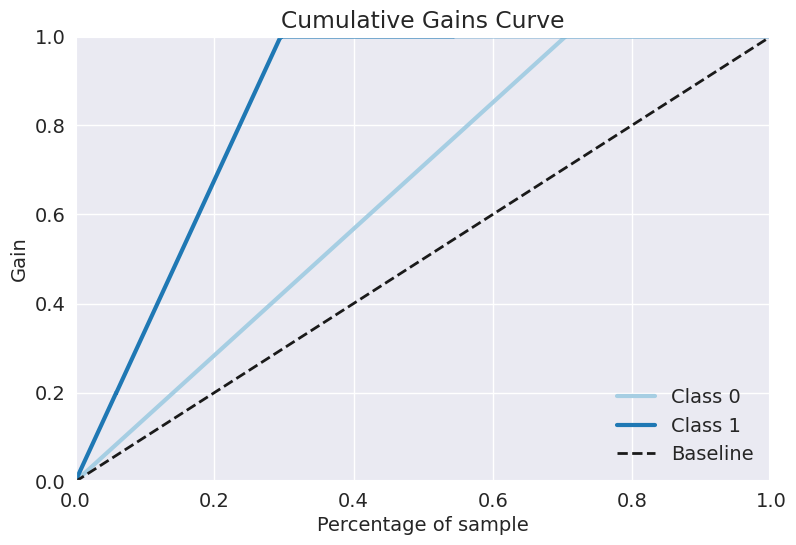

Analysis: 80% of first 1429  instances rank-ordered by propensity are positive actuals in test dataset of size  4847
Percentage of rank-ordered data to take as leads:  29.482153909634825
LEADS:



,Actual,Predicted,Propensity
0,1,1,1.000000
1,1,1,1.000000
2,1,1,1.000000
3,1,1,1.000000
4,1,1,1.000000
...,...,...,...
1425,1,0,0.322333
1426,1,0,0.286851
1427,1,0,0.212496
1428,0,0,0.199697


In [67]:
clf_propensities = pd.DataFrame(clf.predict_proba(X_test_std)) 

# Create a dataframe showing actuals, predicted, and propensities 
y_pred = pd.DataFrame(y_pred)
y_pred.reset_index(drop = True , inplace = True)
y_test.reset_index(drop = True , inplace = True)
results = pd.concat([y_test, y_pred, clf_propensities[1]], axis=1)
results.columns= ['Actual','Predicted','Propensity']

# Sort the instances in results by propsensity
results.sort_values(by=['Propensity'], inplace=True, ascending=False)
results.reset_index(drop = True , inplace = True)

# Plot gains chart
skplt.metrics.plot_cumulative_gain(y_test, clf_propensities)
plt.show()

# Find the top-rated instances in results such that the actual positive label for 'Converted' of those instances is greater than or equal to 80%
# We will assume the first lead has a positive actual
index = 2
n = 1
fraction = 1
while ((index < len(results)) & (fraction >= 0.8)):
  if results.loc[index,'Actual'] == 1:
    n=n+1
  fraction = n/index
  index = index + 1

print('Analysis: 80% of first',n,' instances rank-ordered by propensity are positive actuals in test dataset of size ',len(results))
print('Percentage of rank-ordered data to take as leads: ',100*n/len(results))
print('LEADS:\n')
results.loc[:n]

#*XAI*

In [68]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedKFold, GridSearchCV



##**LGBM Model**#

In [69]:
from lightgbm import LGBMClassifier
import numpy as np



# Fit the pipeline to the data
clf.fit(X_train_SMOTE_std, y_train_SMOTE) # prepo data



y_pred = clf.predict(X_train)
y_pred = pd.DataFrame(y_pred)



### Permuatation Importance

Text(0.5, 0, 'Permutation Importance')

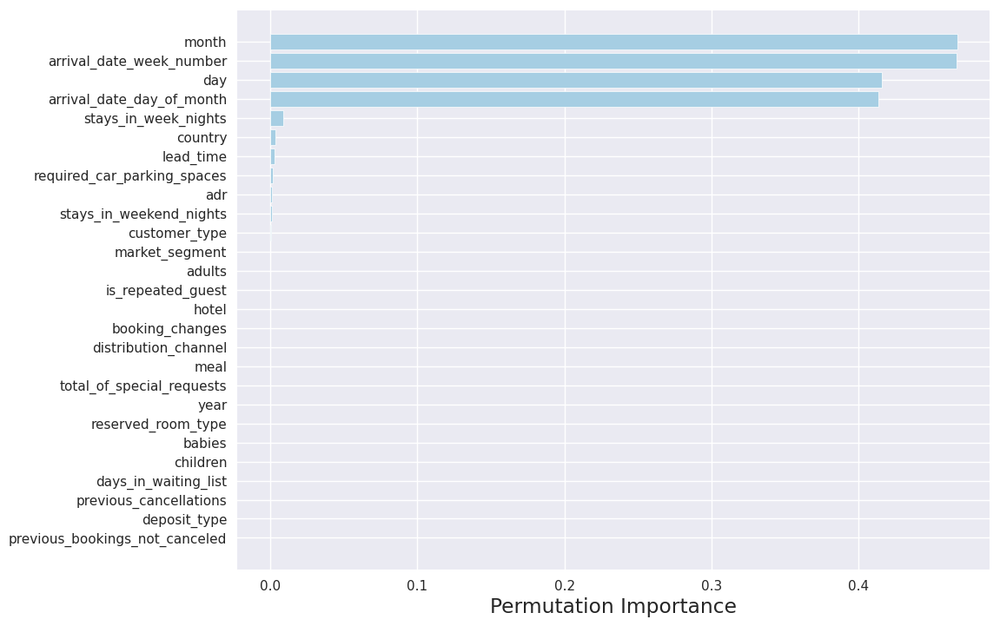

In [70]:
plt.rcParams["figure.figsize"] = (10,8)
perm_importance = permutation_importance(clf, X_test_std, y_test) # on test data
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(cols[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")

###*Feature Importance(Global)*

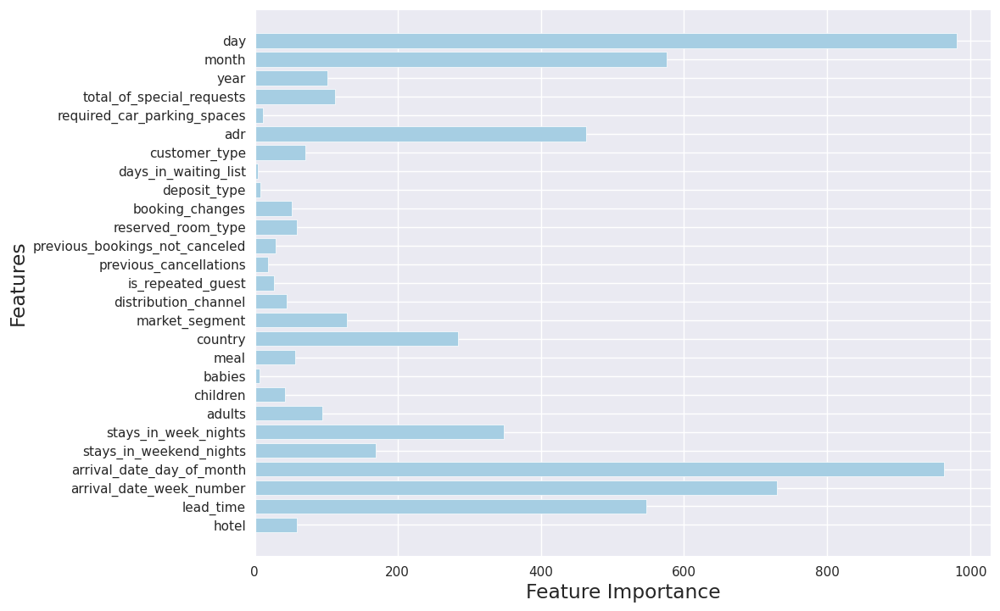

In [71]:


import numpy as np



# Get feature importances
importances = clf.named_steps['clf'].feature_importances_

# Visualize feature importances
plt.barh(X_test.columns, importances) # test data
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.show()


###*Shapey Values (Global)**

In [72]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 10.4 MB/s eta 0:00:00


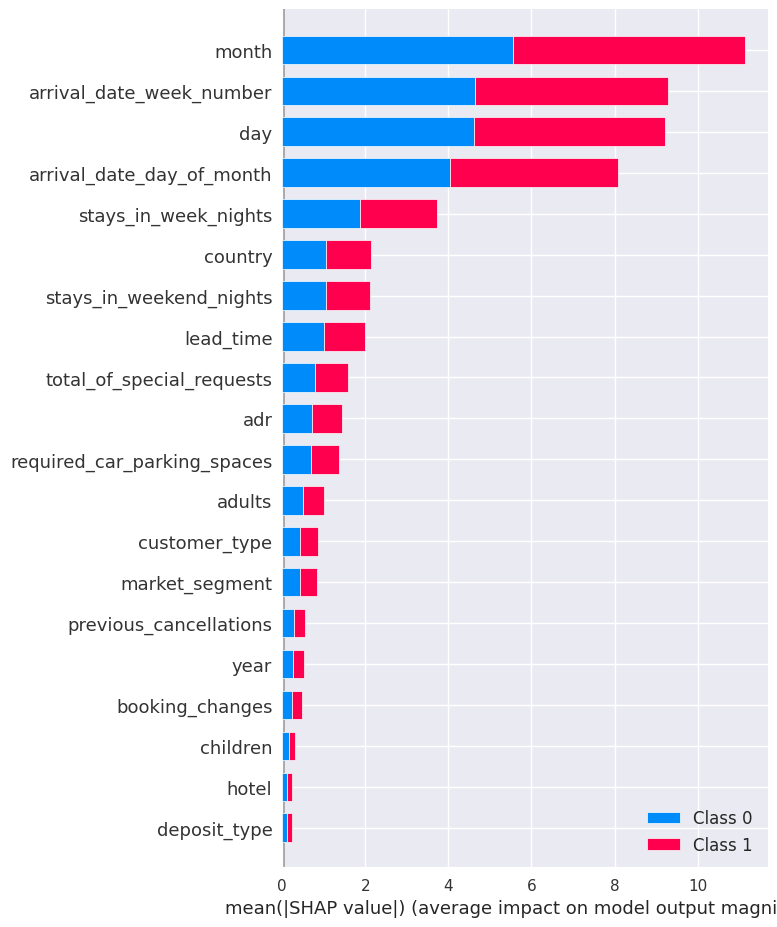

In [73]:
import shap

# Assuming your model is named 'clf' and it's the last step in the pipeline
model = clf.named_steps['clf']

# Fit the model on the training data
model.fit(X_train_SMOTE_std, y_train_SMOTE)

# Create the SHAP explainer using the underlying model
explainer = shap.TreeExplainer(model)

# Generate SHAP values for the training data
shap_values = explainer.shap_values(X_train_SMOTE_std)

# Plot the summary plot
shap.summary_plot(shap_values, X_train_SMOTE_std, plot_type='bar', feature_names=cols)


###*Partial Dependence Plots* 

---

\

<Figure size 4000x3000 with 0 Axes>

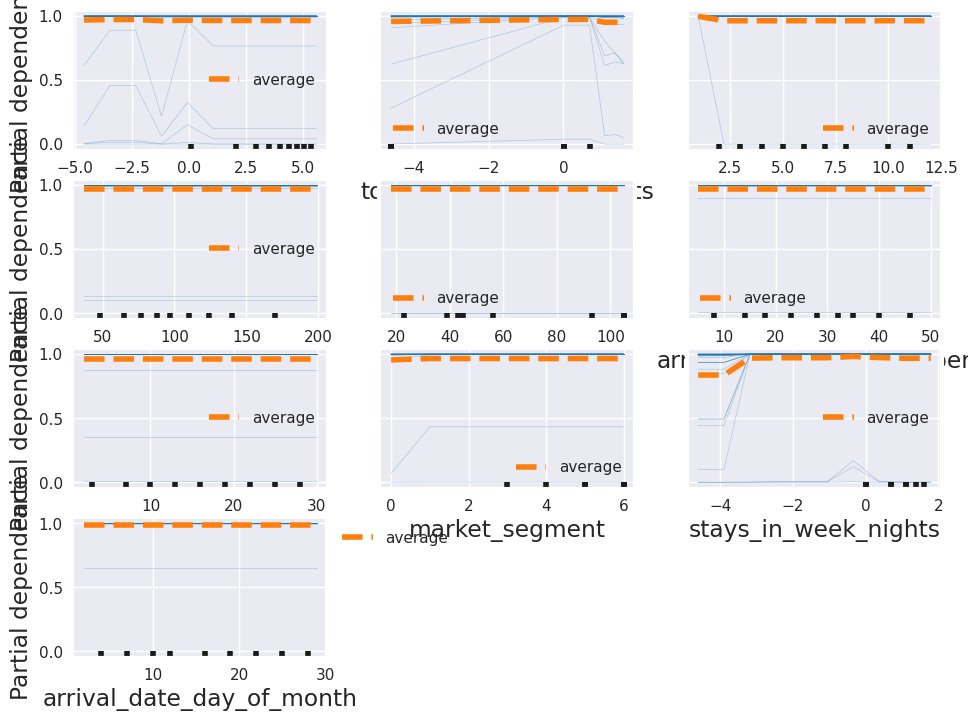

In [74]:
# PDPs
n = 50
fig = plt.figure(figsize=(40, 30))
pdp_features = ['lead_time','total_of_special_requests','month','adr','country','arrival_date_week_number','day','market_segment','stays_in_week_nights','arrival_date_day_of_month']
PartialDependenceDisplay.from_estimator(
  clf, X_test, pdp_features, kind="both", n_jobs=3, subsample=n, grid_resolution=10)
plt.legend(bbox_to_anchor=(1,1));

<Figure size 1000x800 with 0 Axes>

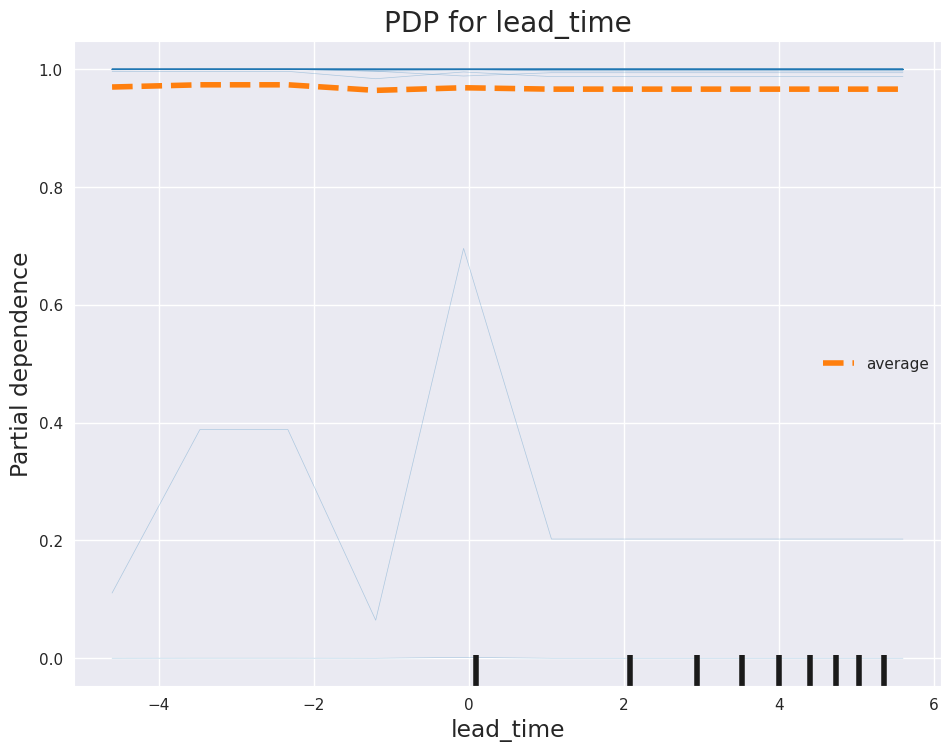

<Figure size 1000x800 with 0 Axes>

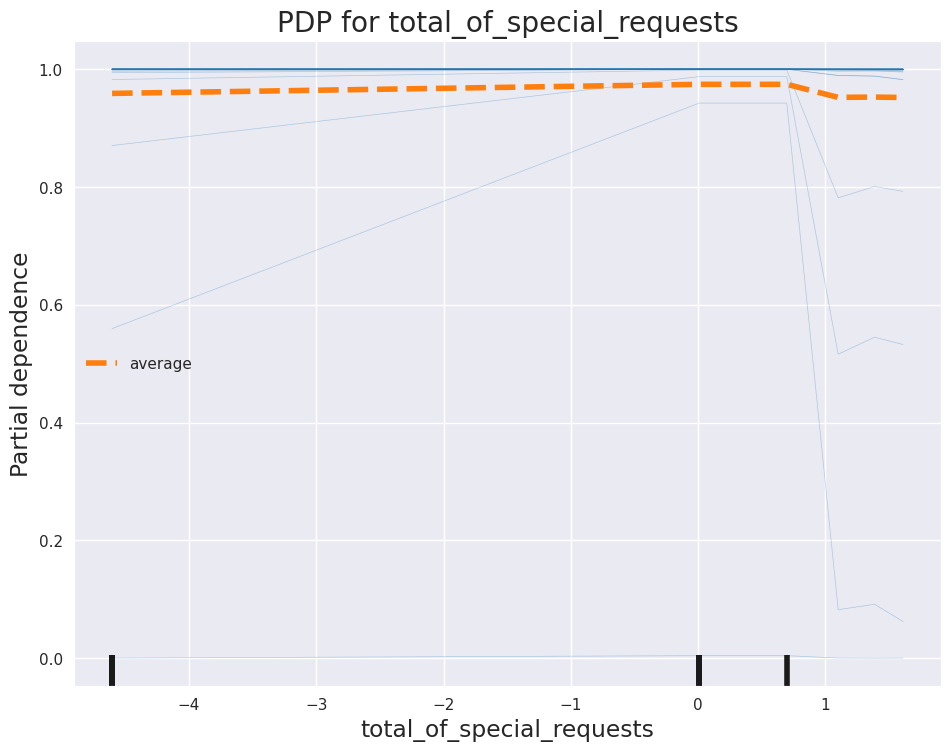

<Figure size 1000x800 with 0 Axes>

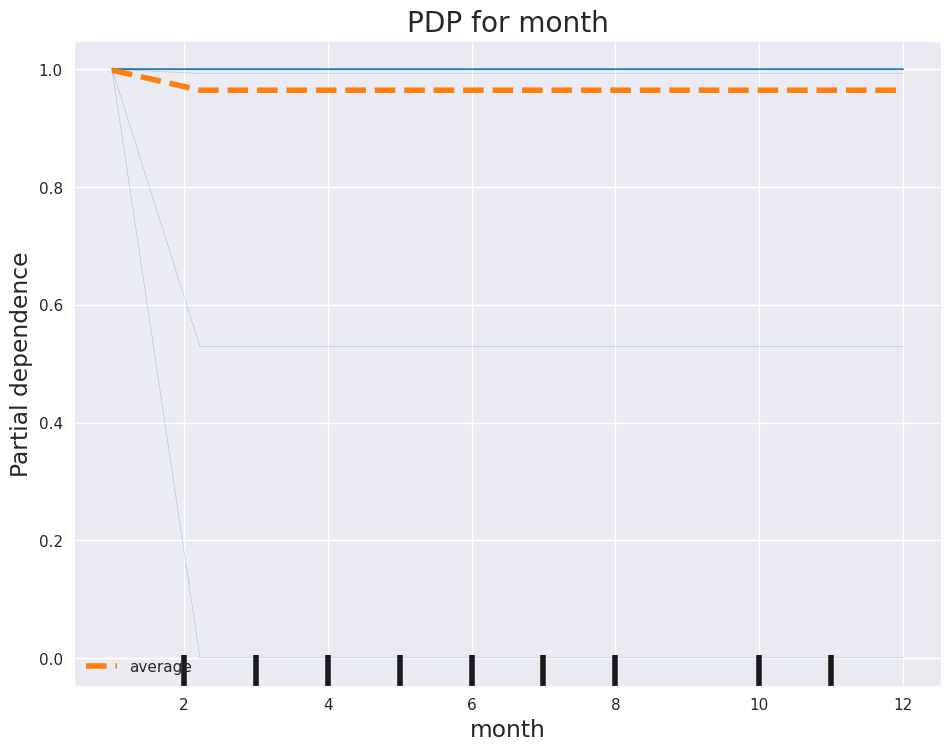

<Figure size 1000x800 with 0 Axes>

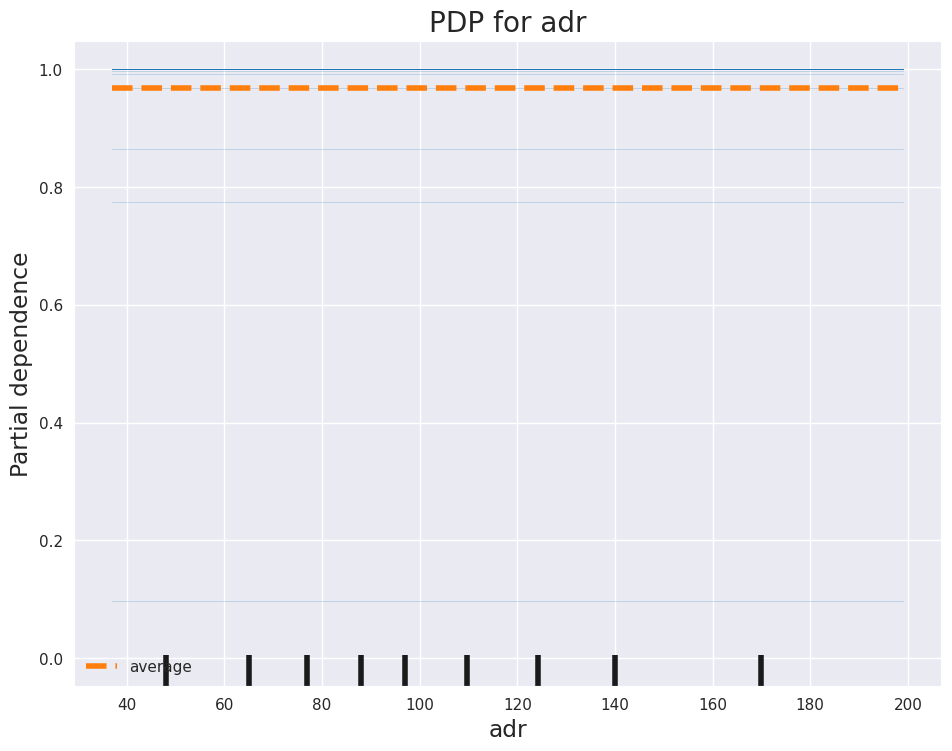

<Figure size 1000x800 with 0 Axes>

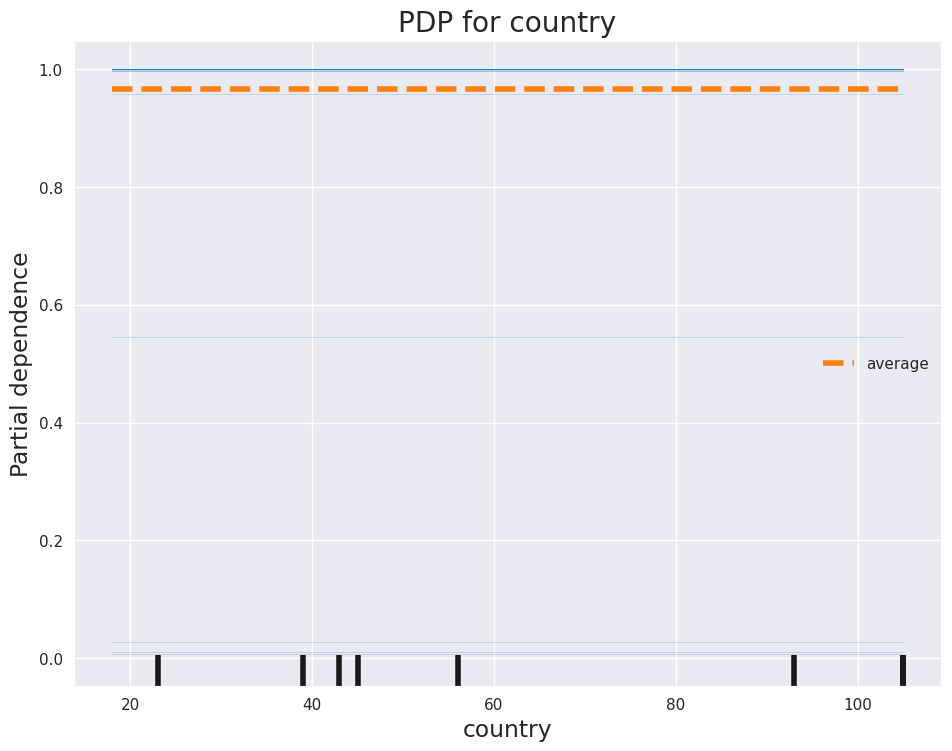

<Figure size 1000x800 with 0 Axes>

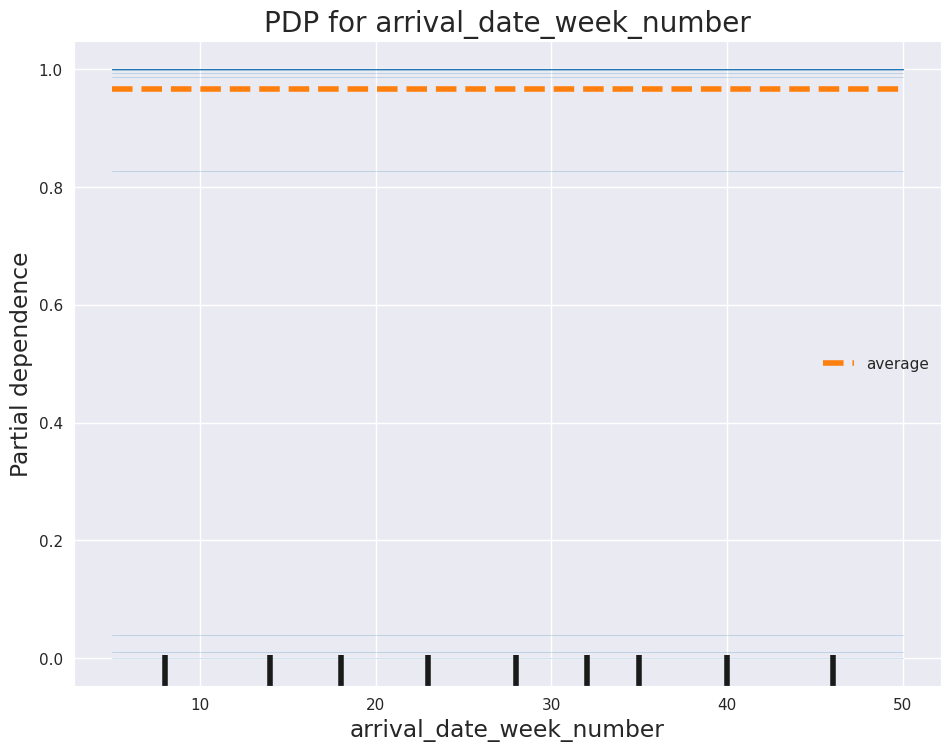

<Figure size 1000x800 with 0 Axes>

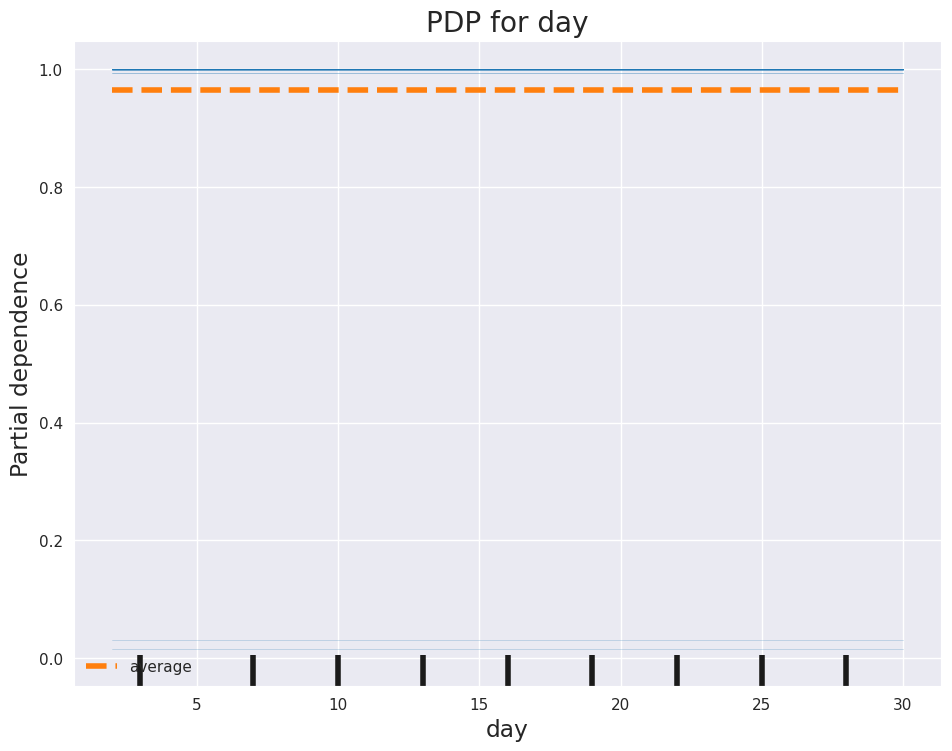

<Figure size 1000x800 with 0 Axes>

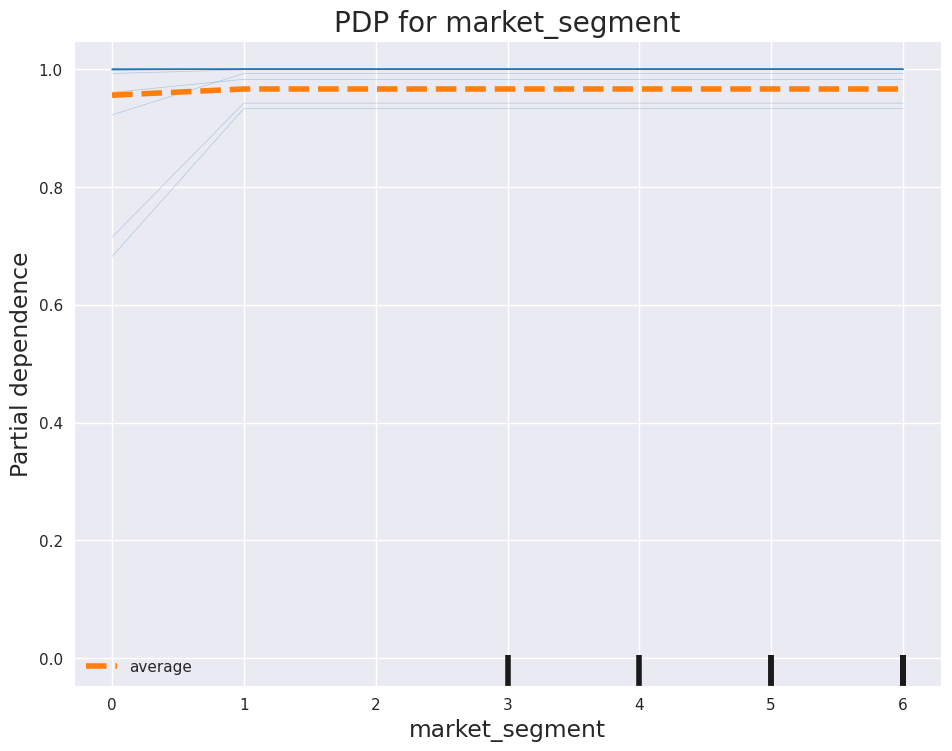

<Figure size 1000x800 with 0 Axes>

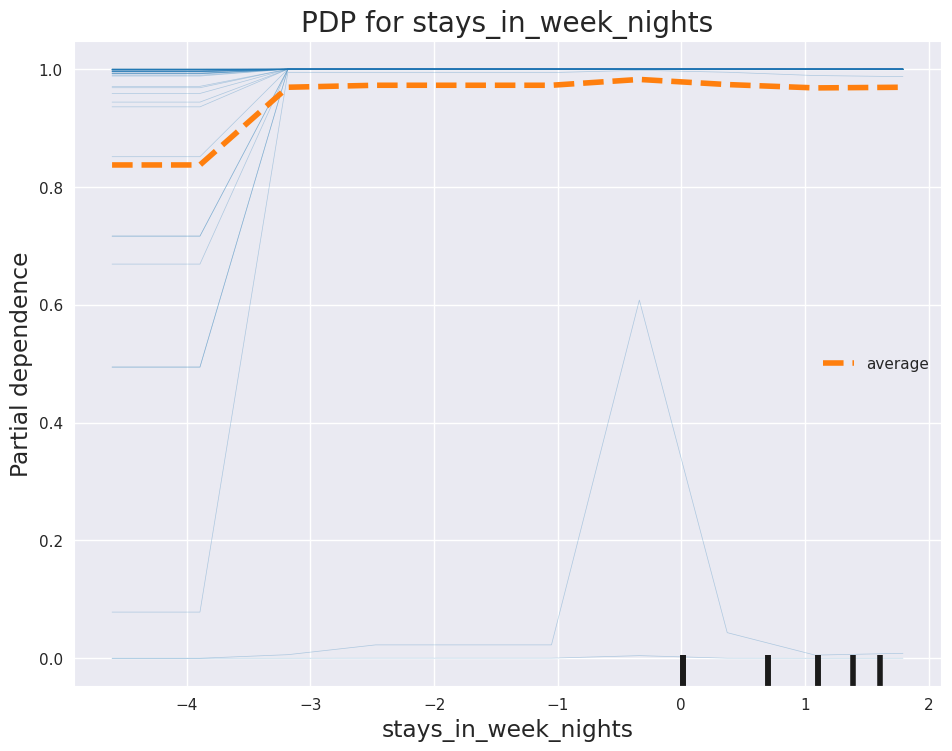

<Figure size 1000x800 with 0 Axes>

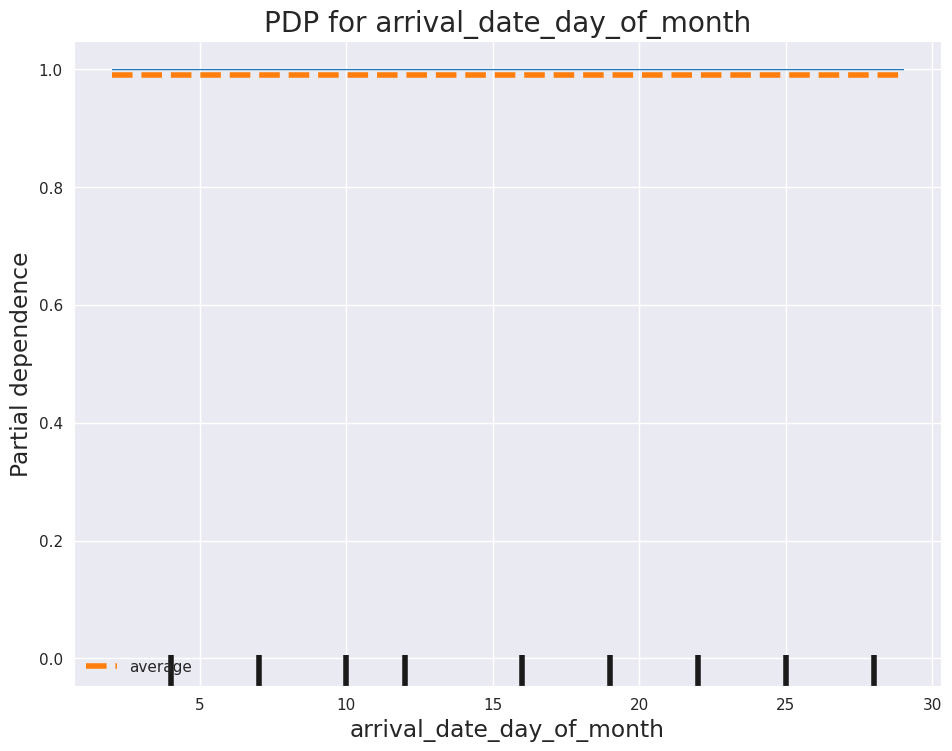

In [75]:
pdp_features = ['lead_time', 'total_of_special_requests', 'month', 'adr', 'country', 'arrival_date_week_number', 'day', 'market_segment', 'stays_in_week_nights', 'arrival_date_day_of_month']

for feature in pdp_features:
    fig = plt.figure(figsize=(10, 8))
    PartialDependenceDisplay.from_estimator(clf, X_test, [feature], kind="both", n_jobs=3, subsample=n, grid_resolution=10)
    plt.title(f"PDP for {feature}")
    plt.show()

###*Surrogate Models (Global)*

In [76]:
Xcols=X_test.columns
clf

Pipeline(memory=None,
         steps=[('sample',
                 SMOTE(k_neighbors=5, n_jobs=None, random_state=None,
                       sampling_strategy='auto')),
                ('std',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('clf',
                 LGBMClassifier(boosting_type='gbdt', class_weight=None,
                                colsample_bytree=0.8, importance_type='split',
                                learning_rate=0.5, max_depth=7,
                                min_child_samples=20, min_child_weight=0.001,
                                min_split_gain=0.0, n_estimators=200, n_jobs=-1,
                                num_leaves=31, objective=None,
                                random_state=None, reg_alpha=0.0,
                                reg_lambda=0.0, silent='warn', subsample=1,
                                subsample_for_bin=200000, subsample_freq=0))],
         verbose=False)

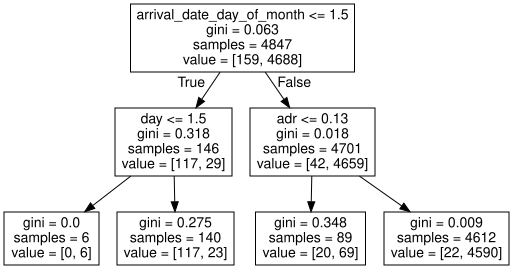

In [77]:

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
import graphviz


proxy = DecisionTreeClassifier(random_state = 20850,max_depth=2)    # Control the depth of the surrogate model tree here

y_pred=clf.predict(X_test)
proxy.fit(X_test,y_pred)

tree_graph = tree.export_graphviz(proxy, out_file = None, feature_names = Xcols)
graphviz.Source(tree_graph)

In [78]:
from sklearn.metrics import matthews_corrcoef
# How good is this surrogate decision tree model? 
# Let's find out by computing the correlation between the predictions of the original model and the surrogate model
y_proxy = proxy.predict(X_test) # Use the decision tree to make predictions
y_proxy = pd.DataFrame(y_proxy)
print("Matthews correlation coefficient (MCC) between LGBM predictions and Surrogate Model predictions: ",matthews_corrcoef(y_pred,y_proxy))

Matthews correlation coefficient (MCC) between LGBM predictions and Surrogate Model predictions:  0.7773913545660568


#**Conclusion**
Strength：
*  LGBM classifier has the best performance with 0.996 AUC and 99.8% accuracy after tuning.
*  Top 4 most important features day, arrival_date_week_number, month, arrival_date_day_of_month.(easy to achieve)

Weakness：
*   Models may need to frequently update to keep up with the fast-changing world.

Oportunity:
*   Optimize revenue
*   Improve operational efficiency
*   Enhance customer service

Threats：
*   It is crucial to always monitor the model's performance, addressing issues as they arise. Also, regularly update the model when needed.
*   It is also important to consider issues such as data privacy, data security.





